In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0532.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0282.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1401.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0914.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0691.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0972.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0818.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0463.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0930.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1323.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1347.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1354.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0704.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0

In [1]:
import os
import time
import csv
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR, ReduceLROnPlateau
from transformers import DeiTImageProcessor, DeiTForImageClassification
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from tqdm import tqdm
import warnings
from transformers.utils import logging
import matplotlib.pyplot as plt

# Disable all warnings
warnings.filterwarnings("ignore")
# Disable Transformers library logs
logging.set_verbosity_error()

# Helper function to format time
def format_time(seconds):
    hours, remainder = divmod(seconds, 3600)
    minutes, seconds = divmod(remainder, 60)
    return f"{int(hours)}h {int(minutes)}m {int(seconds)}s"

# Define directory for saving results
save_dir = "./deit_results"
os.makedirs(save_dir, exist_ok=True)

# Define your dataset with enhanced data augmentation
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),  # New: Add slight translation
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),  # Enhanced color jitter
    transforms.RandomGrayscale(p=0.01),  # Occasionally convert to grayscale
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.1)  # New: Random erasing augmentation
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load dataset
full_dataset = datasets.ImageFolder(root=os.path.join(data_dir, "Training"), transform=train_transform)
print(f"Class list: {full_dataset.classes}")
print(f"Number of classes: {len(full_dataset.classes)}")

2025-05-28 14:09:29.124220: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748441369.317552      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748441369.373729      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Class list: ['glioma', 'meningioma', 'notumor', 'pituitary']
Number of classes: 4


In [2]:
# Initialize DeiT model - using facebook/deit-base-distilled-patch16-224
model_name = "facebook/deit-base-distilled-patch16-224"
processor = DeiTImageProcessor.from_pretrained(model_name)
model = DeiTForImageClassification.from_pretrained(
    model_name,
    num_labels=len(full_dataset.classes),
    ignore_mismatched_sizes=True
)

# Add custom classifier with dropout for regularization
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.classifier.in_features, model.classifier.out_features)
)

# Kiểm tra xem mô hình có thuộc tính này không trước khi sử dụng
# DeiT có thể quản lý distillation token khác với cách bạn đang sử dụng
# Loại bỏ hoặc thay thế phần distillation_classifier

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Split dataset into train and validation
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size])

# Apply validation transform to val_dataset
val_dataset.dataset.transform = val_transform

# Create dataloaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Test dataloader
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"📊 Training images: {len(train_dataset)}")
print(f"📊 Validation images: {len(val_dataset)}")
print(f"📊 Test images: {len(test_dataset)}")


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/349M [00:00<?, ?B/s]

Using device: cuda


model.safetensors:   0%|          | 0.00/349M [00:00<?, ?B/s]

📊 Training images: 4569
📊 Validation images: 1143
📊 Test images: 1311


Số lượng ảnh trong mỗi lớp của tập train:
glioma: 1038
meningioma: 1064
notumor: 1290
pituitary: 1177


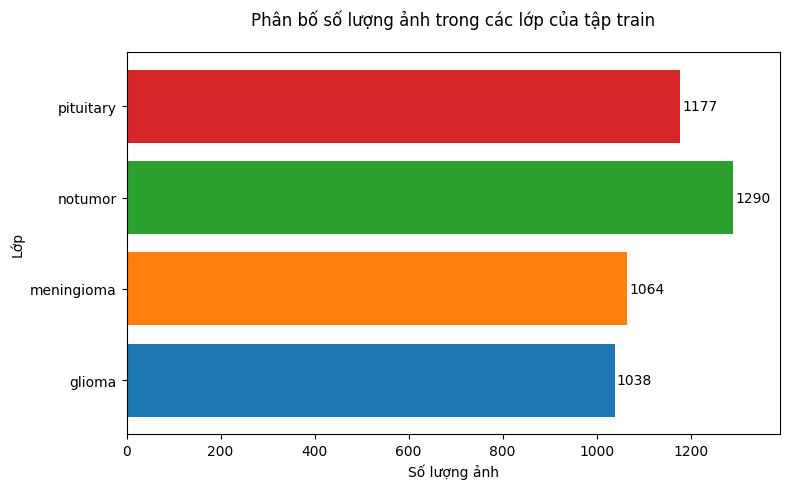

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Lấy chỉ số của các mẫu trong tập train
train_indices = train_dataset.indices
train_labels = [full_dataset.targets[idx] for idx in train_indices]

# Đếm số lượng ảnh trong mỗi lớp
class_counts = Counter(train_labels)
class_names = full_dataset.classes
counts = [class_counts[i] for i in range(len(class_names))]

# In số lượng ảnh trong mỗi lớp
print("Số lượng ảnh trong mỗi lớp của tập train:")
for class_name, count in zip(class_names, counts):
    print(f"{class_name}: {count}")

# Tạo danh sách 4 màu khác nhau cho 4 lớp
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Xanh dương, cam, xanh lá, đỏ

# Vẽ biểu đồ cột nằm
plt.figure(figsize=(8, 5))
bars = plt.barh(class_names, counts, color=colors)
plt.xlabel('Số lượng ảnh')
plt.ylabel('Lớp')
plt.title('Phân bố số lượng ảnh trong các lớp của tập train', loc='center', pad=20)

# Thêm số lượng cụ thể ở cuối mỗi cột
max_count = max(counts)
for bar, count in zip(bars, counts):
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, f'{count}', 
             ha='left', va='center', fontsize=10)

# Điều chỉnh giới hạn trục x để tạo thêm không gian cho số
plt.xlim(0, max_count + 100)  # Thêm khoảng trống 100 đơn vị bên phải

plt.tight_layout()

# Lưu biểu đồ
plt.savefig('train_class_distribution_horizontal.png')

In [3]:
from collections import Counter
import random
import torch
from torch.utils.data import Subset

# Hàm để tạo tập dữ liệu cân bằng
def oversample_dataset(dataset, indices):
    # Lấy nhãn của các mẫu trong tập train
    labels = [dataset.dataset.targets[idx] for idx in indices]
    class_counts = Counter(labels)
    class_names = dataset.dataset.classes
    print("Phân bố lớp trước oversampling:")
    for class_idx, count in class_counts.items():
        print(f"{class_names[class_idx]}: {count}")

    # Tìm số lượng mẫu lớn nhất trong một lớp
    max_count = max(class_counts.values())
    print(f"Số lượng mẫu mục tiêu cho mỗi lớp: {max_count}")

    # Tạo danh sách chỉ số mới (bao gồm cả mẫu được sao chép)
    new_indices = []
    for class_idx in range(len(class_names)):
        # Lấy tất cả chỉ số của lớp hiện tại
        class_indices = [idx for idx in indices if dataset.dataset.targets[idx] == class_idx]
        # Số mẫu cần thêm
        samples_to_add = max_count - len(class_indices)
        # Thêm các chỉ số hiện có
        new_indices.extend(class_indices)
        # Sao chép ngẫu nhiên các mẫu từ lớp hiện tại để đạt max_count
        if samples_to_add > 0:
            new_indices.extend(random.choices(class_indices, k=samples_to_add))

    print(f"Tổng số mẫu sau oversampling: {len(new_indices)}")
    return new_indices

# Áp dụng oversampling lên tập train
new_train_indices = oversample_dataset(train_dataset, train_dataset.indices)

# Cập nhật tập train với chỉ số mới
train_dataset = Subset(full_dataset, new_train_indices)

# Tạo lại train_loader (không cần sampler nữa vì dữ liệu đã cân bằng)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Kiểm tra phân bố lớp sau oversampling
def check_dataset_distribution(dataset, indices):
    labels = [dataset.dataset.targets[idx] for idx in indices]
    class_counts = Counter(labels)
    print("Phân bố lớp sau oversampling trong tập train:")
    for class_idx, count in class_counts.items():
        print(f"{full_dataset.classes[class_idx]}: {count}")

check_dataset_distribution(train_dataset, new_train_indices)

Phân bố lớp trước oversampling:
notumor: 1293
pituitary: 1162
meningioma: 1079
glioma: 1035
Số lượng mẫu mục tiêu cho mỗi lớp: 1293
Tổng số mẫu sau oversampling: 5172
Phân bố lớp sau oversampling trong tập train:
glioma: 1293
meningioma: 1293
notumor: 1293
pituitary: 1293


Số lượng ảnh trong mỗi lớp của tập train (sau oversampling):
glioma: 1293
meningioma: 1293
notumor: 1293
pituitary: 1293


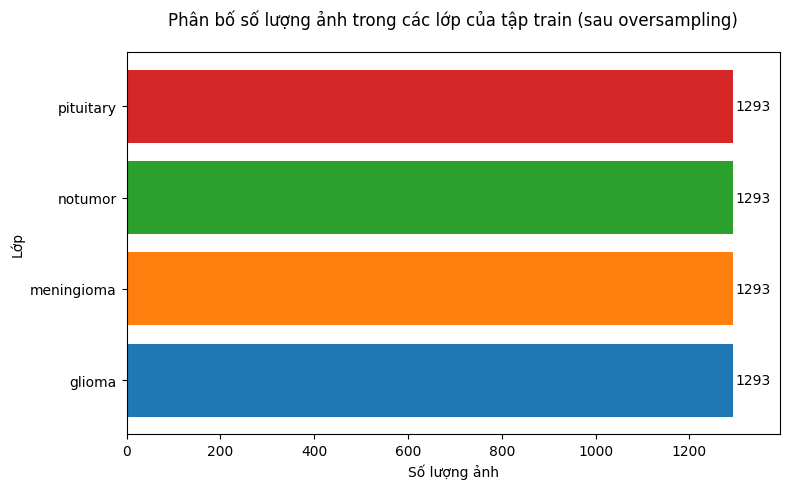

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Lấy chỉ số và nhãn của tập train sau oversampling
train_indices = new_train_indices  # Từ code oversampling trước đó
train_labels = [full_dataset.targets[idx] for idx in train_indices]

# Đếm số lượng ảnh trong mỗi lớp
class_counts = Counter(train_labels)
class_names = full_dataset.classes
counts = [class_counts[i] for i in range(len(class_names))]

# In số lượng ảnh trong mỗi lớp
print("Số lượng ảnh trong mỗi lớp của tập train (sau oversampling):")
for class_name, count in zip(class_names, counts):
    print(f"{class_name}: {count}")

# Tạo danh sách 4 màu khác nhau cho 4 lớp
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Xanh dương, cam, xanh lá, đỏ

# Vẽ biểu đồ cột nằm
plt.figure(figsize=(8, 5))
bars = plt.barh(class_names, counts, color=colors)
plt.xlabel('Số lượng ảnh')
plt.ylabel('Lớp')
plt.title('Phân bố số lượng ảnh trong các lớp của tập train (sau oversampling)', loc='center', pad=20)

# Thêm số lượng cụ thể ở cuối mỗi cột
max_count = max(counts)
for bar, count in zip(bars, counts):
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, f'{count}', 
             ha='left', va='center', fontsize=10)

# Điều chỉnh giới hạn trục x để tạo thêm không gian cho số
plt.xlim(0, max_count + 100)  # Thêm khoảng trống 100 đơn vị bên phải

plt.tight_layout()

# Lưu biểu đồ
plt.savefig('train_class_distribution_horizontal_oversampled.png')
plt.show()

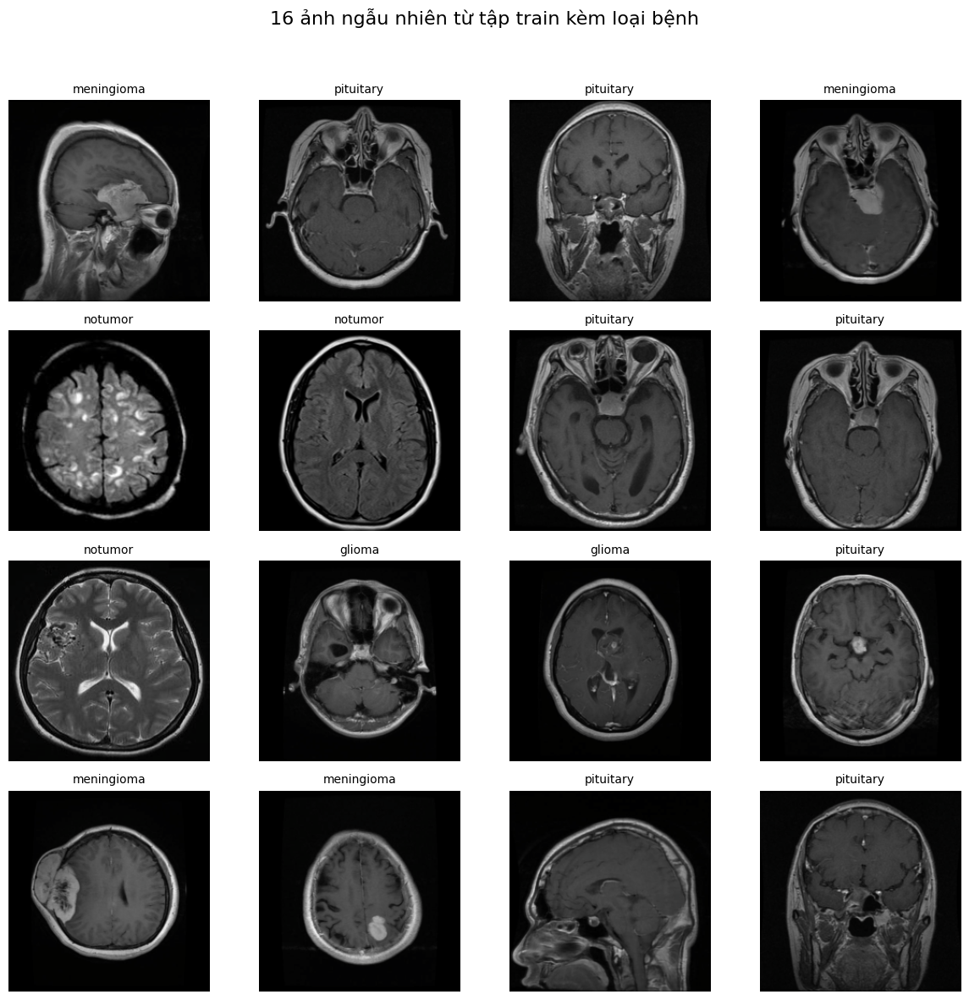

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Lấy danh sách lớp từ full_dataset
class_names = full_dataset.classes

# Lấy 16 mẫu ngẫu nhiên từ train_dataset
random_indices = random.sample(range(len(train_dataset)), 16)
random_samples = [train_dataset[i] for i in random_indices]

# Tạo lưới 4x4 để hiển thị ảnh
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

# Hiển thị từng ảnh và tên loại bệnh
for i, (image, label) in enumerate(random_samples):
    # Chuyển tensor ảnh về định dạng numpy và chuẩn hóa để hiển thị
    image = image.permute(1, 2, 0).numpy()  # Chuyển từ (C, H, W) sang (H, W, C)
    image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Đảo ngược chuẩn hóa
    image = np.clip(image, 0, 1)  # Đảm bảo giá trị trong khoảng [0, 1]

    # Hiển thị ảnh
    axes[i].imshow(image)
    axes[i].set_title(class_names[label], fontsize=10)
    axes[i].axis('off')  # Tắt trục

plt.suptitle('16 ảnh ngẫu nhiên từ tập train kèm loại bệnh', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Điều chỉnh layout để có chỗ cho tiêu đề
plt.savefig('random_train_images.png')

In [4]:

# Freeze most layers and unfreeze more layers for fine-tuning
for param in model.deit.parameters():
    param.requires_grad = False

# Unfreeze the last 6 layers (out of 12)
for i, layer in enumerate(model.deit.encoder.layer):
    if i >= 6:  # Unfreeze from layer 6 onward
        for param in layer.parameters():
            param.requires_grad = True

# Unfreeze classifiers
for param in model.classifier.parameters():
    param.requires_grad = True

# Move model to device
model.to(device)

# Loss function with reduced label smoothing
criterion = nn.CrossEntropyLoss(label_smoothing=0.05)  # Slight label smoothing

# Adjusted learning rates - điều chỉnh optimizer vì không có distillation_classifier
optimizer = optim.AdamW([
    {'params': [p for i, layer in enumerate(model.deit.encoder.layer) if i >= 6 for p in layer.parameters()], 'lr': 8e-6},
    {'params': model.classifier.parameters(), 'lr': 2e-5}
], weight_decay=0.05)

# Optimized learning rate scheduler - điều chỉnh max_lr vì không có distillation_classifier
scheduler = OneCycleLR(
    optimizer, 
    max_lr=[8e-6, 2e-5],
    steps_per_epoch=len(train_loader),
    epochs=350,
    pct_start=0.2,
    div_factor=25,
    final_div_factor=3000,
    anneal_strategy='cos'
)

# Add ReduceLROnPlateau scheduler for dynamic LR adjustment
scheduler_plateau = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=7, verbose=True)

# Training parameters
num_epochs = 200
best_val_acc = 0
patience = 35  # Increased patience
patience_counter = 0
best_val_loss = float('inf')
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
start_total_time = time.time()

# Gradient accumulation steps - increased to simulate larger batch size
accumulation_steps = 4  # Effective batch size = 64

# Training loop
for epoch in range(num_epochs):
    start_time = time.time()

    # Training phase
    model.train()
    train_loss, train_correct, train_total = 0, 0, 0
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader),
                       desc=f"Epoch {epoch+1}/{num_epochs}")

    optimizer.zero_grad()
    
    for batch_idx, (images, labels) in progress_bar:
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = model(images)
        
        # DeiT chỉ sử dụng logits thông thường, không có distillation_logits
        logits = outputs.logits
        
        # Không cần tính trung bình với distillation_logits nữa
        final_logits = logits
        
        loss = criterion(final_logits, labels)
        
        # Normalize loss for gradient accumulation
        loss = loss / accumulation_steps
        loss.backward()
        
        # Update weights every accumulation_steps batches
        if (batch_idx + 1) % accumulation_steps == 0 or (batch_idx + 1) == len(train_loader):
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.5)
            optimizer.step()
            scheduler.step()  # Update learning rate
            optimizer.zero_grad()
        
        # Track metrics
        train_loss += loss.item() * accumulation_steps
        _, predicted = torch.max(final_logits, 1)
        train_correct += (predicted == labels).sum().item()
        train_total += labels.size(0)

        progress_bar.set_postfix(
            loss=loss.item() * accumulation_steps,
            acc=f"{100 * train_correct / train_total:.2f}%"
        )
    
    avg_train_loss = train_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            logits = outputs.logits
            # Không cần distillation_logits nữa
            final_logits = logits
            
            loss = criterion(final_logits, labels)

            val_loss += loss.item()
            _, predicted = torch.max(final_logits, 1)
            val_correct += (predicted == labels).sum().item()
            val_total += labels.size(0)

    # Calculate average metrics
    train_loss = avg_train_loss
    train_acc = 100 * train_correct / train_total
    val_loss /= len(val_loader)
    val_acc = 100 * val_correct / val_total

    # Update ReduceLROnPlateau scheduler
    scheduler_plateau.step(val_loss)

    # Save metrics
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    elapsed_time = format_time(time.time() - start_time)
    print(f"Epoch [{epoch+1}/{num_epochs}] ━ "
          f"Train Loss: {train_loss:.4f} ━ "
          f"Train Acc: {train_acc:.2f}% ━ "
          f"Val Loss: {val_loss:.4f} ━ "
          f"Val Acc: {val_acc:.2f}% ━ "
          f"Time: {elapsed_time}")
    
    # Check if we've reached target loss
    if val_loss <= 0.1:
        print(f"🎯 Target loss of 0.1 reached at epoch {epoch+1}!")
        model_path = os.path.join(save_dir, "deit_model_target_reached.pth")
        torch.save(model.state_dict(), model_path)
        print(f"💾 Model saved at {model_path} with val_loss {val_loss:.4f}")
        
    # Save best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        model_path = os.path.join(save_dir, "deit_model_best_acc.pth")
        torch.save(model.state_dict(), model_path)
        print(f"✅ Model saved at {model_path} with val_acc {val_acc:.2f}%")
    
    # Save best model based on validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        model_path = os.path.join(save_dir, "deit_model_best_loss.pth")
        torch.save(model.state_dict(), model_path)
        print(f"📉 Model saved at {model_path} with val_loss {val_loss:.4f}")
    else:
        patience_counter += 1
    
    # Early stopping check
    if patience_counter >= patience:
        print(f"⚠️ Early stopping triggered after {patience} epochs without improvement")
        break

    # Save checkpoint every 10 epochs
    if (epoch + 1) % 10 == 0:
        checkpoint_path = os.path.join(save_dir, f"deit_model_epoch_{epoch+1}.pth")
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_acc': train_acc,
            'val_acc': val_acc
        }, checkpoint_path)
        print(f"📌 Checkpoint saved at {checkpoint_path}")

# Save final model
final_model_path = os.path.join(save_dir, "deit_model_final.pth")
torch.save(model.state_dict(), final_model_path)
print(f"🏁 Final model saved at {final_model_path}")

# Save training time
total_train_time = time.time() - start_total_time
train_time_path = os.path.join(save_dir, "deit_train_time.txt")
with open(train_time_path, "w") as f:
    f.write(f"Total Training Time: {format_time(total_train_time)}\n")
    f.write(f"Best validation accuracy: {best_val_acc:.2f}%\n")
    f.write(f"Best validation loss: {best_val_loss:.4f}\n")
    f.write(f"Final validation accuracy: {val_acc:.2f}%\n")
    f.write(f"Final validation loss: {val_loss:.4f}\n")
print(f"🕒 Total training time: {format_time(total_train_time)}")

# Save training log
csv_path = os.path.join(save_dir, "deit_training_log.csv")
with open(csv_path, "w", newline="") as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(["Epoch", "Train Loss", "Train Accuracy", "Val Loss", "Val Accuracy"])
    for epoch_idx in range(len(train_losses)):
        csvwriter.writerow([
            epoch_idx+1,
            train_losses[epoch_idx],
            train_accuracies[epoch_idx],
            val_losses[epoch_idx],
            val_accuracies[epoch_idx]
        ])
print(f"📊 Training log saved to {csv_path}")

# Function for evaluating the model on test set
def evaluate_model(model, test_loader, device):
    model.eval()
    test_correct, test_total = 0, 0
    predictions = []
    true_labels = []
    
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing"):
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            logits = outputs.logits
            # Không sử dụng distillation_logits
            final_logits = logits
            
            _, predicted = torch.max(final_logits, 1)
            test_correct += (predicted == labels).sum().item()
            test_total += labels.size(0)
            
            predictions.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    
    accuracy = 100 * test_correct / test_total
    print(f"Test Accuracy: {accuracy:.2f}%")
    
    # Create a confusion matrix visualization
    from sklearn.metrics import confusion_matrix, classification_report
    import seaborn as sns
    
    cm = confusion_matrix(true_labels, predictions)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
                xticklabels=test_dataset.dataset.classes, 
                yticklabels=test_dataset.dataset.classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"Confusion Matrix - Test Accuracy: {accuracy:.2f}%")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "confusion_matrix.png"))
    
    # Generate classification report
    report = classification_report(true_labels, predictions, 
                                  target_names=test_dataset.dataset.classes)
    print("\nClassification Report:")
    print(report)
    
    with open(os.path.join(save_dir, "classification_report.txt"), "w") as f:
        f.write(f"Test Accuracy: {accuracy:.2f}%\n\n")
        f.write(report)
    
    return accuracy, predictions, true_labels

# Evaluate the final model on test set
print("\n🧪 Evaluating final model on test set...")
final_model = DeiTForImageClassification.from_pretrained(
    model_name,
    num_labels=len(full_dataset.classes),
    ignore_mismatched_sizes=True
)
final_model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(final_model.classifier.in_features, final_model.classifier.out_features)
)
# Bỏ qua dòng khởi tạo cho distillation_classifier


Epoch 1/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=27.07%, loss=1.67]


Epoch [1/200] ━ Train Loss: 1.5069 ━ Train Acc: 27.07% ━ Val Loss: 1.3489 ━ Val Acc: 34.56% ━ Time: 0h 2m 26s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 34.56%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 1.3489


Epoch 2/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=37.03%, loss=1.27] 


Epoch [2/200] ━ Train Loss: 1.3385 ━ Train Acc: 37.03% ━ Val Loss: 1.2178 ━ Val Acc: 50.48% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 50.48%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 1.2178


Epoch 3/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=47.80%, loss=1.3]  


Epoch [3/200] ━ Train Loss: 1.2161 ━ Train Acc: 47.80% ━ Val Loss: 1.1098 ━ Val Acc: 60.54% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 60.54%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 1.1098


Epoch 4/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=57.32%, loss=1.25] 


Epoch [4/200] ━ Train Loss: 1.1019 ━ Train Acc: 57.32% ━ Val Loss: 1.0174 ━ Val Acc: 67.80% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 67.80%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 1.0174


Epoch 5/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=63.45%, loss=0.874]


Epoch [5/200] ━ Train Loss: 1.0113 ━ Train Acc: 63.45% ━ Val Loss: 0.9368 ━ Val Acc: 72.44% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 72.44%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.9368


Epoch 6/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=69.07%, loss=0.834]


Epoch [6/200] ━ Train Loss: 0.9349 ━ Train Acc: 69.07% ━ Val Loss: 0.8650 ━ Val Acc: 75.59% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 75.59%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.8650


Epoch 7/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=72.44%, loss=1.08] 


Epoch [7/200] ━ Train Loss: 0.8666 ━ Train Acc: 72.44% ━ Val Loss: 0.8023 ━ Val Acc: 78.65% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 78.65%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.8023


Epoch 8/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=75.79%, loss=0.751]


Epoch [8/200] ━ Train Loss: 0.8010 ━ Train Acc: 75.79% ━ Val Loss: 0.7468 ━ Val Acc: 79.79% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 79.79%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.7468


Epoch 9/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=77.96%, loss=0.904]


Epoch [9/200] ━ Train Loss: 0.7425 ━ Train Acc: 77.96% ━ Val Loss: 0.6984 ━ Val Acc: 81.89% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 81.89%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.6984


Epoch 10/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=80.74%, loss=1.09] 


Epoch [10/200] ━ Train Loss: 0.7020 ━ Train Acc: 80.74% ━ Val Loss: 0.6584 ━ Val Acc: 82.59% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 82.59%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.6584
📌 Checkpoint saved at ./deit_results/deit_model_epoch_10.pth


Epoch 11/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=81.42%, loss=0.585]


Epoch [11/200] ━ Train Loss: 0.6634 ━ Train Acc: 81.42% ━ Val Loss: 0.6220 ━ Val Acc: 83.38% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 83.38%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.6220


Epoch 12/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=83.15%, loss=0.484]


Epoch [12/200] ━ Train Loss: 0.6230 ━ Train Acc: 83.15% ━ Val Loss: 0.5913 ━ Val Acc: 84.34% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 84.34%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.5913


Epoch 13/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=83.89%, loss=0.433]


Epoch [13/200] ━ Train Loss: 0.5980 ━ Train Acc: 83.89% ━ Val Loss: 0.5645 ━ Val Acc: 85.56% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 85.56%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.5645


Epoch 14/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=85.25%, loss=0.416]


Epoch [14/200] ━ Train Loss: 0.5709 ━ Train Acc: 85.25% ━ Val Loss: 0.5420 ━ Val Acc: 86.26% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 86.26%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.5420


Epoch 15/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=86.08%, loss=0.506]


Epoch [15/200] ━ Train Loss: 0.5445 ━ Train Acc: 86.08% ━ Val Loss: 0.5235 ━ Val Acc: 86.61% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 86.61%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.5235


Epoch 16/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=87.17%, loss=0.808]


Epoch [16/200] ━ Train Loss: 0.5268 ━ Train Acc: 87.17% ━ Val Loss: 0.5069 ━ Val Acc: 87.14% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 87.14%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.5069


Epoch 17/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=87.50%, loss=0.735]


Epoch [17/200] ━ Train Loss: 0.5114 ━ Train Acc: 87.50% ━ Val Loss: 0.4923 ━ Val Acc: 87.49% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 87.49%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4923


Epoch 18/200: 100%|██████████| 286/286 [02:00<00:00,  2.38it/s, acc=88.38%, loss=0.516]


Epoch [18/200] ━ Train Loss: 0.4901 ━ Train Acc: 88.38% ━ Val Loss: 0.4790 ━ Val Acc: 87.84% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 87.84%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4790


Epoch 19/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=88.66%, loss=0.398]


Epoch [19/200] ━ Train Loss: 0.4815 ━ Train Acc: 88.66% ━ Val Loss: 0.4675 ━ Val Acc: 88.28% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 88.28%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4675


Epoch 20/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=88.20%, loss=0.505]


Epoch [20/200] ━ Train Loss: 0.4659 ━ Train Acc: 88.20% ━ Val Loss: 0.4566 ━ Val Acc: 88.63% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 88.63%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4566
📌 Checkpoint saved at ./deit_results/deit_model_epoch_20.pth


Epoch 21/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=89.76%, loss=0.334]


Epoch [21/200] ━ Train Loss: 0.4548 ━ Train Acc: 89.76% ━ Val Loss: 0.4476 ━ Val Acc: 88.89% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 88.89%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4476


Epoch 22/200: 100%|██████████| 286/286 [02:00<00:00,  2.38it/s, acc=89.60%, loss=0.332]


Epoch [22/200] ━ Train Loss: 0.4492 ━ Train Acc: 89.60% ━ Val Loss: 0.4381 ━ Val Acc: 89.15% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 89.15%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4381


Epoch 23/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=90.24%, loss=0.643]


Epoch [23/200] ━ Train Loss: 0.4324 ━ Train Acc: 90.24% ━ Val Loss: 0.4301 ━ Val Acc: 89.68% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 89.68%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4301


Epoch 24/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=90.46%, loss=0.677]


Epoch [24/200] ━ Train Loss: 0.4264 ━ Train Acc: 90.46% ━ Val Loss: 0.4224 ━ Val Acc: 90.03% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 90.03%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4224


Epoch 25/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=90.74%, loss=0.27] 


Epoch [25/200] ━ Train Loss: 0.4195 ━ Train Acc: 90.74% ━ Val Loss: 0.4147 ━ Val Acc: 90.29% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 90.29%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4147


Epoch 26/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=91.42%, loss=0.37] 


Epoch [26/200] ━ Train Loss: 0.4073 ━ Train Acc: 91.42% ━ Val Loss: 0.4075 ━ Val Acc: 90.73% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 90.73%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4075


Epoch 27/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=92.38%, loss=0.374]


Epoch [27/200] ━ Train Loss: 0.3959 ━ Train Acc: 92.38% ━ Val Loss: 0.4008 ━ Val Acc: 91.25% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 91.25%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.4008


Epoch 28/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=92.38%, loss=0.243]


Epoch [28/200] ━ Train Loss: 0.3896 ━ Train Acc: 92.38% ━ Val Loss: 0.3937 ━ Val Acc: 91.86% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 91.86%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3937


Epoch 29/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=92.65%, loss=0.382]


Epoch [29/200] ━ Train Loss: 0.3819 ━ Train Acc: 92.65% ━ Val Loss: 0.3873 ━ Val Acc: 92.04% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 92.04%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3873


Epoch 30/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=93.11%, loss=0.286]


Epoch [30/200] ━ Train Loss: 0.3778 ━ Train Acc: 93.11% ━ Val Loss: 0.3811 ━ Val Acc: 92.48% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 92.48%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3811
📌 Checkpoint saved at ./deit_results/deit_model_epoch_30.pth


Epoch 31/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=93.17%, loss=0.29] 


Epoch [31/200] ━ Train Loss: 0.3671 ━ Train Acc: 93.17% ━ Val Loss: 0.3751 ━ Val Acc: 92.56% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 92.56%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3751


Epoch 32/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=93.85%, loss=0.248]


Epoch [32/200] ━ Train Loss: 0.3600 ━ Train Acc: 93.85% ━ Val Loss: 0.3694 ━ Val Acc: 92.56% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3694


Epoch 33/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=94.16%, loss=0.419]


Epoch [33/200] ━ Train Loss: 0.3550 ━ Train Acc: 94.16% ━ Val Loss: 0.3634 ━ Val Acc: 92.83% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 92.83%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3634


Epoch 34/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=94.38%, loss=0.621]


Epoch [34/200] ━ Train Loss: 0.3484 ━ Train Acc: 94.38% ━ Val Loss: 0.3581 ━ Val Acc: 93.18% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 93.18%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3581


Epoch 35/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=95.14%, loss=0.354]


Epoch [35/200] ━ Train Loss: 0.3399 ━ Train Acc: 95.14% ━ Val Loss: 0.3523 ━ Val Acc: 93.61% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 93.61%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3523


Epoch 36/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=95.08%, loss=0.388]


Epoch [36/200] ━ Train Loss: 0.3355 ━ Train Acc: 95.08% ━ Val Loss: 0.3471 ━ Val Acc: 93.96% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 93.96%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3471


Epoch 37/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=95.40%, loss=0.264]


Epoch [37/200] ━ Train Loss: 0.3307 ━ Train Acc: 95.40% ━ Val Loss: 0.3419 ━ Val Acc: 94.23% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 94.23%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3419


Epoch 38/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=95.51%, loss=0.272]


Epoch [38/200] ━ Train Loss: 0.3231 ━ Train Acc: 95.51% ━ Val Loss: 0.3375 ━ Val Acc: 94.75% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 94.75%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3375


Epoch 39/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=95.95%, loss=0.331]


Epoch [39/200] ━ Train Loss: 0.3180 ━ Train Acc: 95.95% ━ Val Loss: 0.3318 ━ Val Acc: 95.10% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 95.10%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3318


Epoch 40/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=96.61%, loss=0.227]


Epoch [40/200] ━ Train Loss: 0.3125 ━ Train Acc: 96.61% ━ Val Loss: 0.3278 ━ Val Acc: 95.45% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 95.45%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3278
📌 Checkpoint saved at ./deit_results/deit_model_epoch_40.pth


Epoch 41/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=96.65%, loss=0.223]


Epoch [41/200] ━ Train Loss: 0.3079 ━ Train Acc: 96.65% ━ Val Loss: 0.3235 ━ Val Acc: 95.36% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3235


Epoch 42/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=96.67%, loss=0.315]


Epoch [42/200] ━ Train Loss: 0.3027 ━ Train Acc: 96.67% ━ Val Loss: 0.3188 ━ Val Acc: 95.71% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 95.71%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3188


Epoch 43/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=97.40%, loss=0.349]


Epoch [43/200] ━ Train Loss: 0.2971 ━ Train Acc: 97.40% ━ Val Loss: 0.3154 ━ Val Acc: 96.06% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 96.06%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3154


Epoch 44/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=97.81%, loss=0.251]


Epoch [44/200] ━ Train Loss: 0.2896 ━ Train Acc: 97.81% ━ Val Loss: 0.3116 ━ Val Acc: 96.15% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 96.15%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3116


Epoch 45/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=97.44%, loss=0.255]


Epoch [45/200] ━ Train Loss: 0.2885 ━ Train Acc: 97.44% ━ Val Loss: 0.3072 ━ Val Acc: 96.33% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 96.33%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3072


Epoch 46/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=97.94%, loss=0.244]


Epoch [46/200] ━ Train Loss: 0.2825 ━ Train Acc: 97.94% ━ Val Loss: 0.3043 ━ Val Acc: 96.15% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3043


Epoch 47/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=97.94%, loss=0.262]


Epoch [47/200] ━ Train Loss: 0.2804 ━ Train Acc: 97.94% ━ Val Loss: 0.3004 ━ Val Acc: 96.59% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 96.59%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.3004


Epoch 48/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=98.34%, loss=0.279]


Epoch [48/200] ━ Train Loss: 0.2745 ━ Train Acc: 98.34% ━ Val Loss: 0.2984 ━ Val Acc: 96.59% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2984


Epoch 49/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=98.66%, loss=0.221]


Epoch [49/200] ━ Train Loss: 0.2687 ━ Train Acc: 98.66% ━ Val Loss: 0.2947 ━ Val Acc: 96.76% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 96.76%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2947


Epoch 50/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=98.60%, loss=0.291]


Epoch [50/200] ━ Train Loss: 0.2676 ━ Train Acc: 98.60% ━ Val Loss: 0.2921 ━ Val Acc: 96.76% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2921
📌 Checkpoint saved at ./deit_results/deit_model_epoch_50.pth


Epoch 51/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=98.93%, loss=0.291]


Epoch [51/200] ━ Train Loss: 0.2632 ━ Train Acc: 98.93% ━ Val Loss: 0.2892 ━ Val Acc: 97.11% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 97.11%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2892


Epoch 52/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=98.93%, loss=0.231]


Epoch [52/200] ━ Train Loss: 0.2605 ━ Train Acc: 98.93% ━ Val Loss: 0.2870 ━ Val Acc: 97.11% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2870


Epoch 53/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=98.91%, loss=0.322]


Epoch [53/200] ━ Train Loss: 0.2577 ━ Train Acc: 98.91% ━ Val Loss: 0.2854 ━ Val Acc: 97.29% ━ Time: 0h 2m 17s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 97.29%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2854


Epoch 54/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=99.19%, loss=0.228]


Epoch [54/200] ━ Train Loss: 0.2539 ━ Train Acc: 99.19% ━ Val Loss: 0.2814 ━ Val Acc: 97.55% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 97.55%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2814


Epoch 55/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.30%, loss=0.221]


Epoch [55/200] ━ Train Loss: 0.2514 ━ Train Acc: 99.30% ━ Val Loss: 0.2795 ━ Val Acc: 97.46% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2795


Epoch 56/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.45%, loss=0.254]


Epoch [56/200] ━ Train Loss: 0.2479 ━ Train Acc: 99.45% ━ Val Loss: 0.2786 ━ Val Acc: 97.81% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 97.81%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2786


Epoch 57/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.47%, loss=0.262]


Epoch [57/200] ━ Train Loss: 0.2450 ━ Train Acc: 99.47% ━ Val Loss: 0.2781 ━ Val Acc: 97.73% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2781


Epoch 58/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.63%, loss=0.229]


Epoch [58/200] ━ Train Loss: 0.2420 ━ Train Acc: 99.63% ━ Val Loss: 0.2731 ━ Val Acc: 97.90% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 97.90%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2731


Epoch 59/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.72%, loss=0.231]


Epoch [59/200] ━ Train Loss: 0.2405 ━ Train Acc: 99.72% ━ Val Loss: 0.2715 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 98.08%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2715


Epoch 60/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.76%, loss=0.217]


Epoch [60/200] ━ Train Loss: 0.2377 ━ Train Acc: 99.76% ━ Val Loss: 0.2699 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2699
📌 Checkpoint saved at ./deit_results/deit_model_epoch_60.pth


Epoch 61/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.80%, loss=0.216]


Epoch [61/200] ━ Train Loss: 0.2348 ━ Train Acc: 99.80% ━ Val Loss: 0.2680 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2680


Epoch 62/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=99.85%, loss=0.228]


Epoch [62/200] ━ Train Loss: 0.2326 ━ Train Acc: 99.85% ━ Val Loss: 0.2674 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2674


Epoch 63/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.82%, loss=0.22] 


Epoch [63/200] ━ Train Loss: 0.2306 ━ Train Acc: 99.82% ━ Val Loss: 0.2651 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 98.34%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2651


Epoch 64/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.89%, loss=0.242]


Epoch [64/200] ━ Train Loss: 0.2285 ━ Train Acc: 99.89% ━ Val Loss: 0.2639 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2639


Epoch 65/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.93%, loss=0.227]


Epoch [65/200] ━ Train Loss: 0.2258 ━ Train Acc: 99.93% ━ Val Loss: 0.2626 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2626


Epoch 66/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=99.96%, loss=0.231] 


Epoch [66/200] ━ Train Loss: 0.2248 ━ Train Acc: 99.96% ━ Val Loss: 0.2628 ━ Val Acc: 98.08% ━ Time: 0h 2m 19s


Epoch 67/200: 100%|██████████| 286/286 [02:02<00:00,  2.34it/s, acc=99.96%, loss=0.257]


Epoch [67/200] ━ Train Loss: 0.2235 ━ Train Acc: 99.96% ━ Val Loss: 0.2610 ━ Val Acc: 98.25% ━ Time: 0h 2m 19s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2610


Epoch 68/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=99.98%, loss=0.25]  


Epoch [68/200] ━ Train Loss: 0.2214 ━ Train Acc: 99.98% ━ Val Loss: 0.2600 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2600


Epoch 69/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.96%, loss=0.222] 


Epoch [69/200] ━ Train Loss: 0.2209 ━ Train Acc: 99.96% ━ Val Loss: 0.2610 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s


Epoch 70/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.98%, loss=0.214]


Epoch [70/200] ━ Train Loss: 0.2195 ━ Train Acc: 99.98% ━ Val Loss: 0.2581 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2581
📌 Checkpoint saved at ./deit_results/deit_model_epoch_70.pth


Epoch 71/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.98%, loss=0.213] 


Epoch [71/200] ━ Train Loss: 0.2184 ━ Train Acc: 99.98% ━ Val Loss: 0.2578 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2578


Epoch 72/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.98%, loss=0.213]


Epoch [72/200] ━ Train Loss: 0.2171 ━ Train Acc: 99.98% ━ Val Loss: 0.2579 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 98.43%


Epoch 73/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.215]


Epoch [73/200] ━ Train Loss: 0.2161 ━ Train Acc: 100.00% ━ Val Loss: 0.2572 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2572


Epoch 74/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=99.98%, loss=0.215] 


Epoch [74/200] ━ Train Loss: 0.2159 ━ Train Acc: 99.98% ━ Val Loss: 0.2557 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2557


Epoch 75/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.215]


Epoch [75/200] ━ Train Loss: 0.2149 ━ Train Acc: 100.00% ━ Val Loss: 0.2556 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2556


Epoch 76/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.212]


Epoch [76/200] ━ Train Loss: 0.2142 ━ Train Acc: 100.00% ━ Val Loss: 0.2556 ━ Val Acc: 98.16% ━ Time: 0h 2m 19s


Epoch 77/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.209]


Epoch [77/200] ━ Train Loss: 0.2130 ━ Train Acc: 100.00% ━ Val Loss: 0.2572 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 78/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.207]


Epoch [78/200] ━ Train Loss: 0.2127 ━ Train Acc: 100.00% ━ Val Loss: 0.2535 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2535


Epoch 79/200: 100%|██████████| 286/286 [02:02<00:00,  2.34it/s, acc=100.00%, loss=0.212]


Epoch [79/200] ━ Train Loss: 0.2121 ━ Train Acc: 100.00% ━ Val Loss: 0.2537 ━ Val Acc: 98.16% ━ Time: 0h 2m 19s


Epoch 80/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.209]


Epoch [80/200] ━ Train Loss: 0.2118 ━ Train Acc: 100.00% ━ Val Loss: 0.2521 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2521
📌 Checkpoint saved at ./deit_results/deit_model_epoch_80.pth


Epoch 81/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.211]


Epoch [81/200] ━ Train Loss: 0.2112 ━ Train Acc: 100.00% ━ Val Loss: 0.2542 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s


Epoch 82/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.212]


Epoch [82/200] ━ Train Loss: 0.2107 ━ Train Acc: 100.00% ━ Val Loss: 0.2543 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s


Epoch 83/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.211]


Epoch [83/200] ━ Train Loss: 0.2100 ━ Train Acc: 100.00% ━ Val Loss: 0.2526 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 84/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.212]


Epoch [84/200] ━ Train Loss: 0.2099 ━ Train Acc: 100.00% ━ Val Loss: 0.2522 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s


Epoch 85/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.208]


Epoch [85/200] ━ Train Loss: 0.2096 ━ Train Acc: 100.00% ━ Val Loss: 0.2525 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s


Epoch 86/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.208]


Epoch [86/200] ━ Train Loss: 0.2091 ━ Train Acc: 100.00% ━ Val Loss: 0.2523 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 87/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.21] 


Epoch [87/200] ━ Train Loss: 0.2091 ━ Train Acc: 100.00% ━ Val Loss: 0.2527 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 88/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.206]


Epoch [88/200] ━ Train Loss: 0.2087 ━ Train Acc: 100.00% ━ Val Loss: 0.2515 ━ Val Acc: 98.16% ━ Time: 0h 2m 19s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2515


Epoch 89/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=100.00%, loss=0.21] 


Epoch [89/200] ━ Train Loss: 0.2085 ━ Train Acc: 100.00% ━ Val Loss: 0.2505 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2505


Epoch 90/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.208]


Epoch [90/200] ━ Train Loss: 0.2081 ━ Train Acc: 100.00% ━ Val Loss: 0.2528 ━ Val Acc: 97.99% ━ Time: 0h 2m 17s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_90.pth


Epoch 91/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.208]


Epoch [91/200] ━ Train Loss: 0.2077 ━ Train Acc: 100.00% ━ Val Loss: 0.2522 ━ Val Acc: 97.90% ━ Time: 0h 2m 17s


Epoch 92/200: 100%|██████████| 286/286 [02:00<00:00,  2.38it/s, acc=100.00%, loss=0.205]


Epoch [92/200] ━ Train Loss: 0.2075 ━ Train Acc: 100.00% ━ Val Loss: 0.2501 ━ Val Acc: 98.08% ━ Time: 0h 2m 17s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2501


Epoch 93/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.207]


Epoch [93/200] ━ Train Loss: 0.2073 ━ Train Acc: 100.00% ━ Val Loss: 0.2518 ━ Val Acc: 97.99% ━ Time: 0h 2m 17s


Epoch 94/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=100.00%, loss=0.209]


Epoch [94/200] ━ Train Loss: 0.2070 ━ Train Acc: 100.00% ━ Val Loss: 0.2527 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 95/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.209]


Epoch [95/200] ━ Train Loss: 0.2070 ━ Train Acc: 100.00% ━ Val Loss: 0.2504 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 96/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.209]


Epoch [96/200] ━ Train Loss: 0.2067 ━ Train Acc: 100.00% ━ Val Loss: 0.2504 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s


Epoch 97/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.205]


Epoch [97/200] ━ Train Loss: 0.2067 ━ Train Acc: 100.00% ━ Val Loss: 0.2497 ━ Val Acc: 97.99% ━ Time: 0h 2m 17s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2497


Epoch 98/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.204]


Epoch [98/200] ━ Train Loss: 0.2063 ━ Train Acc: 100.00% ━ Val Loss: 0.2492 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2492


Epoch 99/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.205]


Epoch [99/200] ━ Train Loss: 0.2064 ━ Train Acc: 100.00% ━ Val Loss: 0.2499 ━ Val Acc: 97.81% ━ Time: 0h 2m 18s


Epoch 100/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.205]


Epoch [100/200] ━ Train Loss: 0.2061 ━ Train Acc: 100.00% ━ Val Loss: 0.2493 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_100.pth


Epoch 101/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.204]


Epoch [101/200] ━ Train Loss: 0.2060 ━ Train Acc: 100.00% ━ Val Loss: 0.2504 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 102/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.21] 


Epoch [102/200] ━ Train Loss: 0.2058 ━ Train Acc: 100.00% ━ Val Loss: 0.2497 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 103/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.207]


Epoch [103/200] ━ Train Loss: 0.2056 ━ Train Acc: 100.00% ━ Val Loss: 0.2493 ━ Val Acc: 97.90% ━ Time: 0h 2m 18s


Epoch 104/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.203]


Epoch [104/200] ━ Train Loss: 0.2056 ━ Train Acc: 100.00% ━ Val Loss: 0.2484 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2484


Epoch 105/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=100.00%, loss=0.207]


Epoch [105/200] ━ Train Loss: 0.2053 ━ Train Acc: 100.00% ━ Val Loss: 0.2510 ━ Val Acc: 97.81% ━ Time: 0h 2m 18s


Epoch 106/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.205]


Epoch [106/200] ━ Train Loss: 0.2052 ━ Train Acc: 100.00% ━ Val Loss: 0.2484 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2484


Epoch 107/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.204]


Epoch [107/200] ━ Train Loss: 0.2051 ━ Train Acc: 100.00% ━ Val Loss: 0.2504 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s


Epoch 108/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.205]


Epoch [108/200] ━ Train Loss: 0.2051 ━ Train Acc: 100.00% ━ Val Loss: 0.2492 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s


Epoch 109/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.205]


Epoch [109/200] ━ Train Loss: 0.2049 ━ Train Acc: 100.00% ━ Val Loss: 0.2499 ━ Val Acc: 97.90% ━ Time: 0h 2m 18s


Epoch 110/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.204]


Epoch [110/200] ━ Train Loss: 0.2048 ━ Train Acc: 100.00% ━ Val Loss: 0.2483 ━ Val Acc: 98.16% ━ Time: 0h 2m 17s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2483
📌 Checkpoint saved at ./deit_results/deit_model_epoch_110.pth


Epoch 111/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.206]


Epoch [111/200] ━ Train Loss: 0.2047 ━ Train Acc: 100.00% ━ Val Loss: 0.2500 ━ Val Acc: 97.90% ━ Time: 0h 2m 18s


Epoch 112/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.204]


Epoch [112/200] ━ Train Loss: 0.2046 ━ Train Acc: 100.00% ━ Val Loss: 0.2481 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2481


Epoch 113/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.205]


Epoch [113/200] ━ Train Loss: 0.2045 ━ Train Acc: 100.00% ━ Val Loss: 0.2490 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s


Epoch 114/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [114/200] ━ Train Loss: 0.2044 ━ Train Acc: 100.00% ━ Val Loss: 0.2478 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2478


Epoch 115/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.207]


Epoch [115/200] ━ Train Loss: 0.2043 ━ Train Acc: 100.00% ━ Val Loss: 0.2486 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s


Epoch 116/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.204]


Epoch [116/200] ━ Train Loss: 0.2043 ━ Train Acc: 100.00% ━ Val Loss: 0.2479 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s


Epoch 117/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.204]


Epoch [117/200] ━ Train Loss: 0.2041 ━ Train Acc: 100.00% ━ Val Loss: 0.2485 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s


Epoch 118/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.204]


Epoch [118/200] ━ Train Loss: 0.2042 ━ Train Acc: 100.00% ━ Val Loss: 0.2485 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s


Epoch 119/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.205]


Epoch [119/200] ━ Train Loss: 0.2040 ━ Train Acc: 100.00% ━ Val Loss: 0.2481 ━ Val Acc: 97.90% ━ Time: 0h 2m 17s


Epoch 120/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.203]


Epoch [120/200] ━ Train Loss: 0.2039 ━ Train Acc: 100.00% ━ Val Loss: 0.2476 ━ Val Acc: 97.90% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2476
📌 Checkpoint saved at ./deit_results/deit_model_epoch_120.pth


Epoch 121/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [121/200] ━ Train Loss: 0.2039 ━ Train Acc: 100.00% ━ Val Loss: 0.2474 ━ Val Acc: 97.90% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2474


Epoch 122/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.203]


Epoch [122/200] ━ Train Loss: 0.2037 ━ Train Acc: 100.00% ━ Val Loss: 0.2486 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s


Epoch 123/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [123/200] ━ Train Loss: 0.2037 ━ Train Acc: 100.00% ━ Val Loss: 0.2461 ━ Val Acc: 98.16% ━ Time: 0h 2m 17s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2461


Epoch 124/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.208]


Epoch [124/200] ━ Train Loss: 0.2036 ━ Train Acc: 100.00% ━ Val Loss: 0.2490 ━ Val Acc: 97.90% ━ Time: 0h 2m 18s


Epoch 125/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.203]


Epoch [125/200] ━ Train Loss: 0.2036 ━ Train Acc: 100.00% ━ Val Loss: 0.2459 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2459


Epoch 126/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [126/200] ━ Train Loss: 0.2036 ━ Train Acc: 100.00% ━ Val Loss: 0.2467 ━ Val Acc: 98.08% ━ Time: 0h 2m 17s


Epoch 127/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.203]


Epoch [127/200] ━ Train Loss: 0.2035 ━ Train Acc: 100.00% ━ Val Loss: 0.2475 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s


Epoch 128/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [128/200] ━ Train Loss: 0.2034 ━ Train Acc: 100.00% ━ Val Loss: 0.2461 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 129/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [129/200] ━ Train Loss: 0.2034 ━ Train Acc: 100.00% ━ Val Loss: 0.2460 ━ Val Acc: 98.08% ━ Time: 0h 2m 17s


Epoch 130/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [130/200] ━ Train Loss: 0.2033 ━ Train Acc: 100.00% ━ Val Loss: 0.2459 ━ Val Acc: 97.99% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2459
📌 Checkpoint saved at ./deit_results/deit_model_epoch_130.pth


Epoch 131/200: 100%|██████████| 286/286 [02:00<00:00,  2.38it/s, acc=100.00%, loss=0.202]


Epoch [131/200] ━ Train Loss: 0.2033 ━ Train Acc: 100.00% ━ Val Loss: 0.2449 ━ Val Acc: 98.08% ━ Time: 0h 2m 17s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2449


Epoch 132/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [132/200] ━ Train Loss: 0.2031 ━ Train Acc: 100.00% ━ Val Loss: 0.2423 ━ Val Acc: 98.25% ━ Time: 0h 2m 17s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2423


Epoch 133/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [133/200] ━ Train Loss: 0.2032 ━ Train Acc: 100.00% ━ Val Loss: 0.2429 ━ Val Acc: 98.16% ━ Time: 0h 2m 17s


Epoch 134/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.204]


Epoch [134/200] ━ Train Loss: 0.2031 ━ Train Acc: 100.00% ━ Val Loss: 0.2440 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s


Epoch 135/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [135/200] ━ Train Loss: 0.2030 ━ Train Acc: 100.00% ━ Val Loss: 0.2439 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s


Epoch 136/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [136/200] ━ Train Loss: 0.2031 ━ Train Acc: 100.00% ━ Val Loss: 0.2428 ━ Val Acc: 98.25% ━ Time: 0h 2m 17s


Epoch 137/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.204]


Epoch [137/200] ━ Train Loss: 0.2030 ━ Train Acc: 100.00% ━ Val Loss: 0.2440 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s


Epoch 138/200: 100%|██████████| 286/286 [02:00<00:00,  2.38it/s, acc=100.00%, loss=0.202]


Epoch [138/200] ━ Train Loss: 0.2029 ━ Train Acc: 100.00% ━ Val Loss: 0.2446 ━ Val Acc: 98.16% ━ Time: 0h 2m 17s


Epoch 139/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [139/200] ━ Train Loss: 0.2029 ━ Train Acc: 100.00% ━ Val Loss: 0.2457 ━ Val Acc: 98.16% ━ Time: 0h 2m 17s


Epoch 140/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [140/200] ━ Train Loss: 0.2029 ━ Train Acc: 100.00% ━ Val Loss: 0.2456 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_140.pth


Epoch 141/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.203]


Epoch [141/200] ━ Train Loss: 0.2029 ━ Train Acc: 100.00% ━ Val Loss: 0.2460 ━ Val Acc: 98.08% ━ Time: 0h 2m 18s


Epoch 142/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [142/200] ━ Train Loss: 0.2027 ━ Train Acc: 100.00% ━ Val Loss: 0.2421 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2421


Epoch 143/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.205]


Epoch [143/200] ━ Train Loss: 0.2028 ━ Train Acc: 100.00% ━ Val Loss: 0.2394 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2394


Epoch 144/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [144/200] ━ Train Loss: 0.2028 ━ Train Acc: 100.00% ━ Val Loss: 0.2424 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 145/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [145/200] ━ Train Loss: 0.2027 ━ Train Acc: 100.00% ━ Val Loss: 0.2402 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 98.51%


Epoch 146/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [146/200] ━ Train Loss: 0.2026 ━ Train Acc: 100.00% ━ Val Loss: 0.2412 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 147/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.202]


Epoch [147/200] ━ Train Loss: 0.2026 ━ Train Acc: 100.00% ━ Val Loss: 0.2427 ━ Val Acc: 98.34% ━ Time: 0h 2m 19s


Epoch 148/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.204]


Epoch [148/200] ━ Train Loss: 0.2026 ━ Train Acc: 100.00% ━ Val Loss: 0.2447 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s


Epoch 149/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [149/200] ━ Train Loss: 0.2025 ━ Train Acc: 100.00% ━ Val Loss: 0.2435 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 150/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.203]


Epoch [150/200] ━ Train Loss: 0.2025 ━ Train Acc: 100.00% ━ Val Loss: 0.2411 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_150.pth


Epoch 151/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.203]


Epoch [151/200] ━ Train Loss: 0.2025 ━ Train Acc: 100.00% ━ Val Loss: 0.2412 ━ Val Acc: 98.43% ━ Time: 0h 2m 19s


Epoch 152/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.204]


Epoch [152/200] ━ Train Loss: 0.2025 ━ Train Acc: 100.00% ━ Val Loss: 0.2403 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 153/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [153/200] ━ Train Loss: 0.2024 ━ Train Acc: 100.00% ━ Val Loss: 0.2408 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 154/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.202]


Epoch [154/200] ━ Train Loss: 0.2025 ━ Train Acc: 100.00% ━ Val Loss: 0.2394 ━ Val Acc: 98.60% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 98.60%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2394


Epoch 155/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.202]


Epoch [155/200] ━ Train Loss: 0.2024 ━ Train Acc: 100.00% ━ Val Loss: 0.2391 ━ Val Acc: 98.60% ━ Time: 0h 2m 19s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2391


Epoch 156/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [156/200] ━ Train Loss: 0.2024 ━ Train Acc: 100.00% ━ Val Loss: 0.2405 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 157/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.202]


Epoch [157/200] ━ Train Loss: 0.2024 ━ Train Acc: 100.00% ━ Val Loss: 0.2433 ━ Val Acc: 98.25% ━ Time: 0h 2m 19s


Epoch 158/200: 100%|██████████| 286/286 [02:02<00:00,  2.34it/s, acc=100.00%, loss=0.203]


Epoch [158/200] ━ Train Loss: 0.2024 ━ Train Acc: 100.00% ━ Val Loss: 0.2411 ━ Val Acc: 98.43% ━ Time: 0h 2m 19s


Epoch 159/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [159/200] ━ Train Loss: 0.2023 ━ Train Acc: 100.00% ━ Val Loss: 0.2408 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 160/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.202]


Epoch [160/200] ━ Train Loss: 0.2023 ━ Train Acc: 100.00% ━ Val Loss: 0.2397 ━ Val Acc: 98.51% ━ Time: 0h 2m 19s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_160.pth


Epoch 161/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [161/200] ━ Train Loss: 0.2023 ━ Train Acc: 100.00% ━ Val Loss: 0.2394 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 162/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [162/200] ━ Train Loss: 0.2023 ━ Train Acc: 100.00% ━ Val Loss: 0.2388 ━ Val Acc: 98.60% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2388


Epoch 163/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [163/200] ━ Train Loss: 0.2025 ━ Train Acc: 100.00% ━ Val Loss: 0.2398 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 164/200: 100%|██████████| 286/286 [02:01<00:00,  2.35it/s, acc=100.00%, loss=0.202]


Epoch [164/200] ━ Train Loss: 0.2022 ━ Train Acc: 100.00% ━ Val Loss: 0.2397 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 165/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [165/200] ━ Train Loss: 0.2023 ━ Train Acc: 100.00% ━ Val Loss: 0.2402 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 166/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [166/200] ━ Train Loss: 0.2021 ━ Train Acc: 100.00% ━ Val Loss: 0.2405 ━ Val Acc: 98.51% ━ Time: 0h 2m 17s


Epoch 167/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [167/200] ━ Train Loss: 0.2021 ━ Train Acc: 100.00% ━ Val Loss: 0.2416 ━ Val Acc: 98.51% ━ Time: 0h 2m 17s


Epoch 168/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [168/200] ━ Train Loss: 0.2021 ━ Train Acc: 100.00% ━ Val Loss: 0.2420 ━ Val Acc: 98.43% ━ Time: 0h 2m 17s


Epoch 169/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [169/200] ━ Train Loss: 0.2021 ━ Train Acc: 100.00% ━ Val Loss: 0.2379 ━ Val Acc: 98.60% ━ Time: 0h 2m 18s
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2379


Epoch 170/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [170/200] ━ Train Loss: 0.2021 ━ Train Acc: 100.00% ━ Val Loss: 0.2403 ━ Val Acc: 98.51% ━ Time: 0h 2m 17s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_170.pth


Epoch 171/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [171/200] ━ Train Loss: 0.2021 ━ Train Acc: 100.00% ━ Val Loss: 0.2421 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 172/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [172/200] ━ Train Loss: 0.2021 ━ Train Acc: 100.00% ━ Val Loss: 0.2397 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 173/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [173/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2404 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 174/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [174/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2400 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 175/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [175/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2381 ━ Val Acc: 98.60% ━ Time: 0h 2m 18s


Epoch 176/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [176/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2389 ━ Val Acc: 98.69% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 98.69%


Epoch 177/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [177/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2392 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 178/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [178/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2396 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 179/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [179/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2392 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 180/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [180/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2387 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_180.pth


Epoch 181/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [181/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2390 ━ Val Acc: 98.43% ━ Time: 0h 2m 17s


Epoch 182/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [182/200] ━ Train Loss: 0.2019 ━ Train Acc: 100.00% ━ Val Loss: 0.2424 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s


Epoch 183/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [183/200] ━ Train Loss: 0.2019 ━ Train Acc: 100.00% ━ Val Loss: 0.2392 ━ Val Acc: 98.60% ━ Time: 0h 2m 18s


Epoch 184/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [184/200] ━ Train Loss: 0.2019 ━ Train Acc: 100.00% ━ Val Loss: 0.2388 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 185/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [185/200] ━ Train Loss: 0.2019 ━ Train Acc: 100.00% ━ Val Loss: 0.2415 ━ Val Acc: 98.25% ━ Time: 0h 2m 18s


Epoch 186/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [186/200] ━ Train Loss: 0.2019 ━ Train Acc: 100.00% ━ Val Loss: 0.2396 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 187/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=99.98%, loss=0.202] 


Epoch [187/200] ━ Train Loss: 0.2025 ━ Train Acc: 99.98% ━ Val Loss: 0.2511 ━ Val Acc: 98.16% ━ Time: 0h 2m 18s


Epoch 188/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=99.98%, loss=0.202]


Epoch [188/200] ━ Train Loss: 0.2030 ━ Train Acc: 99.98% ━ Val Loss: 0.2470 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 189/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [189/200] ━ Train Loss: 0.2020 ━ Train Acc: 100.00% ━ Val Loss: 0.2440 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 190/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [190/200] ━ Train Loss: 0.2019 ━ Train Acc: 100.00% ━ Val Loss: 0.2443 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_190.pth


Epoch 191/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [191/200] ━ Train Loss: 0.2019 ━ Train Acc: 100.00% ━ Val Loss: 0.2452 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 192/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [192/200] ━ Train Loss: 0.2019 ━ Train Acc: 100.00% ━ Val Loss: 0.2428 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 193/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [193/200] ━ Train Loss: 0.2018 ━ Train Acc: 100.00% ━ Val Loss: 0.2428 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 194/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [194/200] ━ Train Loss: 0.2018 ━ Train Acc: 100.00% ━ Val Loss: 0.2416 ━ Val Acc: 98.43% ━ Time: 0h 2m 17s


Epoch 195/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [195/200] ━ Train Loss: 0.2018 ━ Train Acc: 100.00% ━ Val Loss: 0.2418 ━ Val Acc: 98.34% ━ Time: 0h 2m 18s


Epoch 196/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.203]


Epoch [196/200] ━ Train Loss: 0.2018 ━ Train Acc: 100.00% ━ Val Loss: 0.2419 ━ Val Acc: 98.34% ━ Time: 0h 2m 17s


Epoch 197/200: 100%|██████████| 286/286 [02:00<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [197/200] ━ Train Loss: 0.2018 ━ Train Acc: 100.00% ━ Val Loss: 0.2417 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s


Epoch 198/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [198/200] ━ Train Loss: 0.2018 ━ Train Acc: 100.00% ━ Val Loss: 0.2377 ━ Val Acc: 98.78% ━ Time: 0h 2m 18s
✅ Model saved at ./deit_results/deit_model_best_acc.pth with val_acc 98.78%
📉 Model saved at ./deit_results/deit_model_best_loss.pth with val_loss 0.2377


Epoch 199/200: 100%|██████████| 286/286 [02:01<00:00,  2.36it/s, acc=100.00%, loss=0.202]


Epoch [199/200] ━ Train Loss: 0.2018 ━ Train Acc: 100.00% ━ Val Loss: 0.2399 ━ Val Acc: 98.51% ━ Time: 0h 2m 18s


Epoch 200/200: 100%|██████████| 286/286 [02:00<00:00,  2.37it/s, acc=100.00%, loss=0.202]


Epoch [200/200] ━ Train Loss: 0.2018 ━ Train Acc: 100.00% ━ Val Loss: 0.2423 ━ Val Acc: 98.43% ━ Time: 0h 2m 18s
📌 Checkpoint saved at ./deit_results/deit_model_epoch_200.pth
🏁 Final model saved at ./deit_results/deit_model_final.pth
🕒 Total training time: 7h 43m 38s
📊 Training log saved to ./deit_results/deit_training_log.csv

🧪 Evaluating final model on test set...


Column names in CSV: ['Epoch', 'Train Loss', 'Train Accuracy', 'Val Loss', 'Val Accuracy']


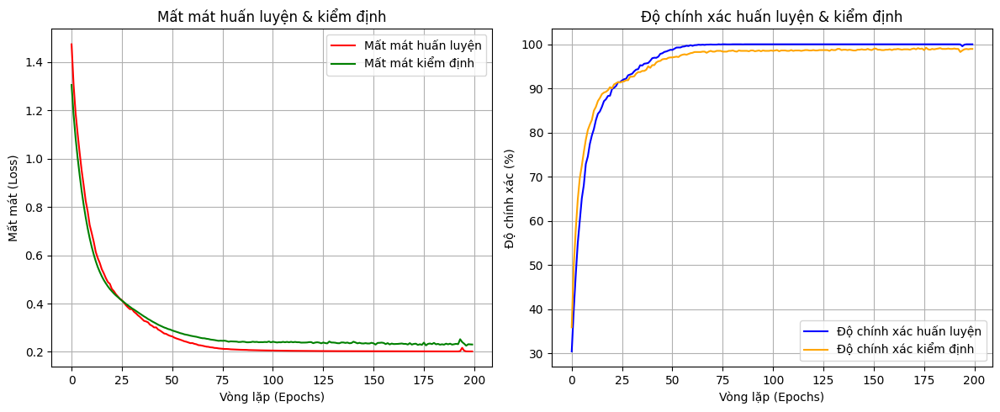

📈 Đã lưu biểu đồ tại /kaggle/working/deit/deit_training_plots.png
Đã load model DeiT từ facebook/deit-base-distilled-patch16-224 và chuyển trọng số từ /kaggle/input/deit_transformer/pytorch/default/2/deit_model_best_acc.pth


In [6]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import torch
from transformers import DeiTForImageClassification

# Tạo thư mục đầu ra nếu chưa tồn tại
save_dir = '/kaggle/working/deit'
os.makedirs(save_dir, exist_ok=True)

# Load lịch sử huấn luyện từ file .csv
history_path = '/kaggle/input/deit_transformer/pytorch/default/2/deit_training_log.csv'
try:
    # Load CSV file
    history = pd.read_csv(history_path)
    
    # Print column names to inspect
    print("Column names in CSV:", history.columns.tolist())
    
    # Define column mapping based on actual CSV column names
    column_mapping = {
        'Train Loss': 'train_loss',
        'Val Loss': 'val_loss',
        'Train Accuracy': 'train_accuracy',
        'Val Accuracy': 'val_accuracy'
    }
    
    # Verify that all required columns exist in the CSV
    required_columns = ['Train Loss', 'Val Loss', 'Train Accuracy', 'Val Accuracy']
    for col in required_columns:
        if col not in history.columns:
            print(f"Error: Column '{col}' not found in CSV.")
            exit(1)
    
    # Extract data using the mapped column names
    train_losses = history['Train Loss'].values
    val_losses = history['Val Loss'].values
    train_accuracies = history['Train Accuracy'].values
    val_accuracies = history['Val Accuracy'].values
    
except Exception as e:
    print(f"Lỗi khi load lịch sử huấn luyện: {e}")
    print("Vui lòng kiểm tra file CSV tại:", history_path)
    exit(1)

# Vẽ biểu đồ lịch sử huấn luyện
try:
    plt.figure(figsize=(12, 5))

    # Biểu đồ Loss
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Mất mát huấn luyện', color='red')
    plt.plot(val_losses, label='Mất mát kiểm định', color='green')
    plt.xlabel('Vòng lặp (Epochs)')
    plt.ylabel('Mất mát (Loss)')
    plt.title('Mất mát huấn luyện & kiểm định')
    plt.legend()
    plt.grid()

    # Biểu đồ Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label='Độ chính xác huấn luyện', color='blue')
    plt.plot(val_accuracies, label='Độ chính xác kiểm định', color='orange')
    plt.xlabel('Vòng lặp (Epochs)')
    plt.ylabel('Độ chính xác (%)')
    plt.title('Độ chính xác huấn luyện & kiểm định')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plot_path = os.path.join(save_dir, 'deit_training_plots.png')
    plt.savefig(plot_path)
    plt.show()
    plt.close()
    print(f"📈 Đã lưu biểu đồ tại {plot_path}")
except Exception as e:
    print(f"Lỗi khi vẽ biểu đồ: {e}")
    exit(1)

# Load model DeiT
model_name = "facebook/deit-base-distilled-patch16-224"
model_path = '/kaggle/input/deit_transformer/pytorch/default/2/deit_model_best_acc.pth'
try:
    # Khởi tạo model DeiT
    model = DeiTForImageClassification.from_pretrained(
        model_name,
        num_labels=4,  # Giả sử 4 lớp (brain tumor dataset), thay đổi nếu khác
        ignore_mismatched_sizes=True
    )
    # Load state_dict từ file .pth
    state_dict = torch.load(model_path, map_location='cpu')  # Dùng 'cuda' nếu có GPU
    # Xử lý các trường hợp state_dict khác nhau
    if 'model' in state_dict:
        state_dict = state_dict['model']
    elif 'state_dict' in state_dict:
        state_dict = state_dict['state_dict']
    # Lọc các khóa phù hợp
    model_dict = model.state_dict()
    state_dict = {k: v for k, v in state_dict.items() if k in model_dict and v.size() == model_dict[k].size()}
    model_dict.update(state_dict)
    model.load_state_dict(model_dict, strict=False)  # strict=False để bỏ qua các trọng số không khớp
    model.eval()  # Chuyển sang chế độ đánh giá
    print(f"Đã load model DeiT từ {model_name} và chuyển trọng số từ {model_path}")
except Exception as e:
    print(f"Lỗi khi load model DeiT: {e}")
    exit(1)

In [4]:
from transformers import DeiTForImageClassification
import torch
import torch.nn as nn

# Khởi tạo mô hình
model_name = "facebook/deit-base-distilled-patch16-224"
model = DeiTForImageClassification.from_pretrained(
    model_name,
    num_labels=4,  # Số lớp thực tế của dataset (giống ViT, giả sử là 4 lớp)
    ignore_mismatched_sizes=True
)

# Định nghĩa lại classifier giống như lúc huấn luyện
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)

# Chuyển mô hình sang thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Sử dụng thiết bị: {device}")
model.to(device)

# Tải state_dict
model_path = "/kaggle/input/deit_transformer/pytorch/default/2/deit_model_best_acc.pth"  # Đường dẫn tới file mô hình tốt nhất dựa trên accuracy
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

print("✅ Mô hình DeiT đã được tải thành công!")

Sử dụng thiết bị: cuda
✅ Mô hình DeiT đã được tải thành công!


In [5]:
import torch.nn as nn

# Hàm tính Accuracy và Loss
def evaluate_accuracy_and_loss(model, data_loader, device, criterion):
    model.eval()
    running_loss = 0.0
    correct_preds = 0
    total_samples = 0

    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Tính Acc & Loss"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits

            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)

            _, preds = torch.max(outputs, 1)
            correct_preds += (preds == labels).sum().item()
            total_samples += labels.size(0)

    avg_loss = running_loss / total_samples
    accuracy = correct_preds / total_samples

    return accuracy, avg_loss

# Gọi hàm đánh giá
criterion = nn.CrossEntropyLoss()
accuracy_test, loss_test = evaluate_accuracy_and_loss(model, test_loader, device, criterion)

print(f"\n🎯 Accuracy (Test): {accuracy_test * 100:.2f}%")
print(f"📉 Loss (Test): {loss_test:.4f}")


Tính Acc & Loss: 100%|██████████| 82/82 [00:23<00:00,  3.54it/s]


🎯 Accuracy (Test): 99.16%
📉 Loss (Test): 0.0638



Đánh giá trên tập test:


Processing Test: 100%|██████████| 82/82 [00:18<00:00,  4.42it/s]



F1 Score (Test): 0.9916

Ma trận nhầm lẫn (Test):
[[296   4   0   0]
 [  0 301   2   3]
 [  0   1 404   0]
 [  0   1   0 299]]

Báo cáo phân loại (Test):
              precision    recall  f1-score   support

      glioma       1.00      0.99      0.99       300
  meningioma       0.98      0.98      0.98       306
     notumor       1.00      1.00      1.00       405
   pituitary       0.99      1.00      0.99       300

    accuracy                           0.99      1311
   macro avg       0.99      0.99      0.99      1311
weighted avg       0.99      0.99      0.99      1311

📊 Biểu đồ ma trận nhầm lẫn được lưu tại: /kaggle/working/confusion_matrix_test.png


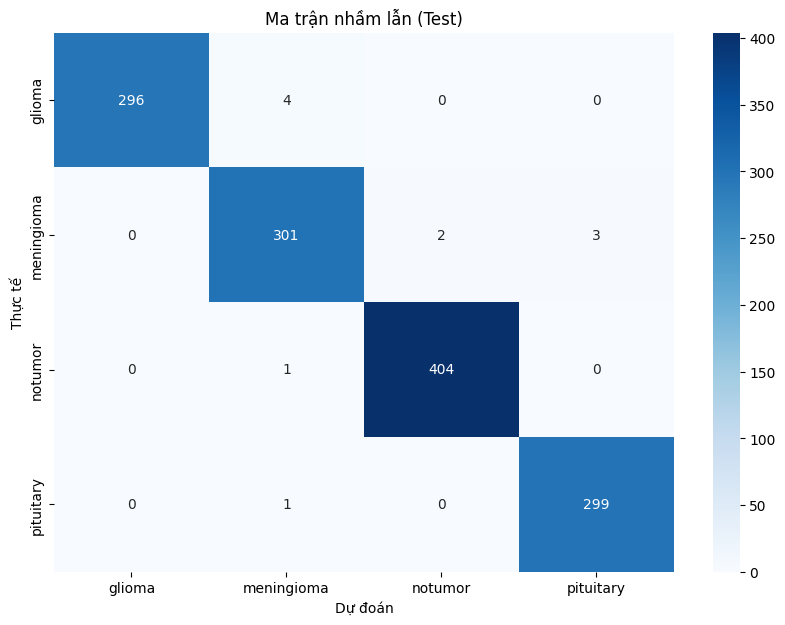

In [10]:
import os
import torch
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

# Hàm lấy dự đoán và thông tin về ảnh nhận diện sai
def get_predictions_with_misclassified(model, data_loader, device, class_names, dataset):
    """
    Đánh giá mô hình, trả về dự đoán và nhãn thực tế.

    Args:
        model: Mô hình đã huấn luyện
        data_loader: DataLoader chứa dữ liệu cần đánh giá
        device: Thiết bị (CPU/GPU)
        class_names: Danh sách tên lớp
        dataset: Dataset gốc để lấy thông tin ảnh

    Returns:
        y_pred: Dự đoán của mô hình (numpy array)
        y_true: Nhãn thực tế (numpy array)
    """
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(tqdm(data_loader, desc="Processing Test")):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            _, preds = torch.max(outputs, 1)

            preds_cpu = preds.cpu().numpy()
            labels_cpu = labels.cpu().numpy()

            all_preds.extend(preds_cpu)
            all_labels.extend(labels_cpu)

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)
    return y_pred, y_true

# Hàm đánh giá và vẽ ma trận nhầm lẫn
def evaluate_and_plot_confusion_matrix(model, data_loader, device, class_names, save_dir, dataset, dataset_name):
    """
    Đánh giá mô hình, tính ma trận nhầm lẫn.

    Args:
        model: Mô hình đã huấn luyện
        data_loader: DataLoader chứa dữ liệu
        device: Thiết bị (CPU/GPU)
        class_names: Danh sách tên lớp
        save_dir: Thư mục để lưu biểu đồ
        dataset: Dataset gốc để lấy thông tin ảnh
        dataset_name: Tên tập dữ liệu
    """
    y_pred, y_true = get_predictions_with_misclassified(model, data_loader, device, class_names, dataset)

    f1 = f1_score(y_true, y_pred, average='weighted')
    print(f'\nF1 Score ({dataset_name}): {f1:.4f}')

    cm = confusion_matrix(y_true, y_pred)
    print(f'\nMa trận nhầm lẫn ({dataset_name}):')
    print(cm)

    print(f"\nBáo cáo phân loại ({dataset_name}):")
    print(classification_report(y_true, y_pred, target_names=class_names))

    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.xlabel('Dự đoán')
    plt.ylabel('Thực tế')
    plt.title(f'Ma trận nhầm lẫn ({dataset_name})')

    plot_path = os.path.join(save_dir, f'confusion_matrix_{dataset_name.lower()}.png')
    plt.savefig(plot_path)
    print(f"📊 Biểu đồ ma trận nhầm lẫn được lưu tại: {plot_path}")
    plt.show()

    return y_pred, y_true

# Thiết lập và chạy cho tập test
save_dir = "/kaggle/working"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
class_names = test_dataset.classes
model.eval()
model.to(device)

print("\nĐánh giá trên tập test:")
y_pred_test, y_true_test = evaluate_and_plot_confusion_matrix(
    model, test_loader, device, class_names, save_dir, test_dataset, "Test"
)

In [11]:
from sklearn.metrics import average_precision_score
import numpy as np
import torch
import os
from tqdm import tqdm

def calculate_mAP(model, data_loader, device, class_names, save_dir):
    """
    Tính mAP (mean Average Precision) cho mô hình trên tập dữ liệu.

    Args:
        model: Mô hình đã huấn luyện
        data_loader: DataLoader chứa dữ liệu cần đánh giá
        device: Thiết bị (CPU/GPU)
        class_names: Danh sách tên lớp
        save_dir: Thư mục để lưu kết quả

    Returns:
        mAP: Giá trị mean Average Precision
        ap_scores: Dictionary chứa AP score cho từng lớp
    """
    model.eval()
    all_probs = []
    all_labels = []

    # Thu thập xác suất dự đoán và nhãn thực tế
    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Calculating mAP"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            probs = torch.softmax(outputs, dim=1)  # Chuyển logits thành xác suất
            all_probs.append(probs.cpu().numpy())
            all_labels.append(labels.cpu().numpy())

    # Chuyển sang numpy arrays
    all_probs = np.concatenate(all_probs, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)

    # Chuyển nhãn thành one-hot encoding để tính AP
    num_classes = len(class_names)
    all_labels_one_hot = np.zeros((all_labels.shape[0], num_classes))
    for i, label in enumerate(all_labels):
        all_labels_one_hot[i, label] = 1

    # Tính AP cho từng lớp
    ap_scores = {}
    for class_idx, class_name in enumerate(class_names):
        ap = average_precision_score(all_labels_one_hot[:, class_idx], all_probs[:, class_idx])
        ap_scores[class_name] = ap
        print(f"AP for class '{class_name}': {ap:.4f}")

    # Tính mAP
    mAP = np.mean(list(ap_scores.values()))
    print(f"\nMean Average Precision (mAP): {mAP:.4f}")

    # Lưu kết quả vào file
    result_path = os.path.join(save_dir, "mAP_results.txt")
    with open(result_path, "w") as f:
        f.write(f"Mean Average Precision (mAP): {mAP:.4f}\n")
        f.write("\nAverage Precision per class:\n")
        for class_name, ap in ap_scores.items():
            f.write(f"{class_name}: {ap:.4f}\n")
    print(f"📊 Kết quả mAP được lưu tại: {result_path}")

    return mAP, ap_scores

# Thiết lập các biến cần thiết
save_dir = "/kaggle/working"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
class_names = test_dataset.classes  # Lấy danh sách tên lớp từ test_dataset

# Đảm bảo mô hình đã được tải và ở chế độ eval
model.eval()
model.to(device)

# Tính mAP trên tập test
print("\nTính mAP trên tập test:")
mAP, ap_scores = calculate_mAP(model, test_loader, device, class_names, save_dir)


Tính mAP trên tập test:


Calculating mAP: 100%|██████████| 82/82 [00:19<00:00,  4.29it/s]

AP for class 'glioma': 0.9977
AP for class 'meningioma': 0.9919
AP for class 'notumor': 1.0000
AP for class 'pituitary': 0.9998

Mean Average Precision (mAP): 0.9974
📊 Kết quả mAP được lưu tại: /kaggle/working/mAP_results.txt


Sử dụng thiết bị: cuda
✅ Mô hình DeiT đã được tải thành công!


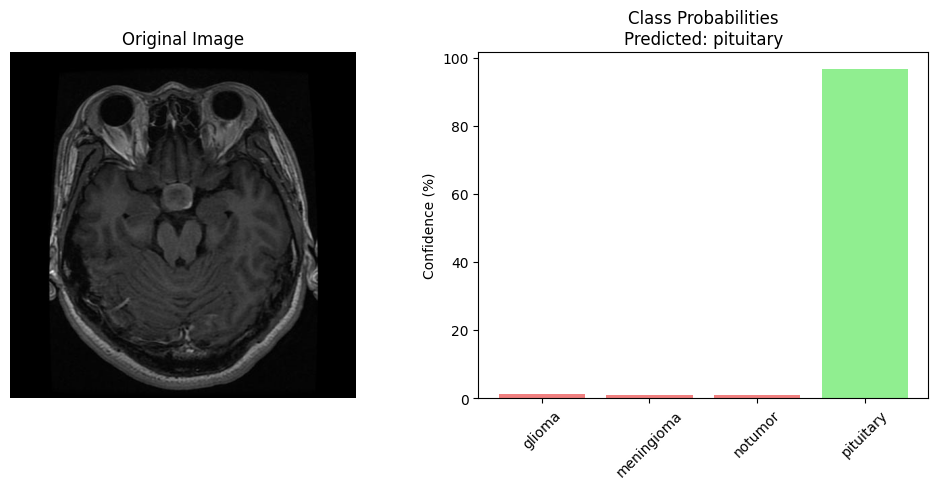


🔍 Prediction Results:
Image: Te-piTr_0009.jpg
Predicted Class: pituitary
Confidence: 96.82%

📊 Class Probabilities:
glioma: 1.16%
meningioma: 1.00%
notumor: 1.02%
pituitary: 96.82%


In [12]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import os
from torchvision import transforms
from transformers import DeiTForImageClassification
import torch.nn as nn
import torch.nn.functional as F

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Sử dụng thiết bị: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/deit/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform (giữ nguyên như ViT vì cả hai đều dùng input 224x224)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load mô hình DeiT
model_name = "facebook/deit-base-distilled-patch16-224"
model = DeiTForImageClassification.from_pretrained(
    model_name,
    num_labels=4,  # Giả sử dataset có 4 lớp: glioma, meningioma, notumor, pituitary
    ignore_mismatched_sizes=True
)

# Định nghĩa lại classifier (đồng bộ với mô hình đã huấn luyện)
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)

# Tải state_dict
model_path = "/kaggle/input/deit_transformer/pytorch/default/2/deit_model_best_acc.pth"
try:
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    print("✅ Mô hình DeiT đã được tải thành công!")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    exit(1)

# Chuyển mô hình sang thiết bị và đặt chế độ eval
model.to(device)
model.eval()

# Định nghĩa nhãn lớp
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

def preprocess_image(image_path):
    """Tiền xử lý ảnh"""
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def predict_single_image(image_path, model):
    """
    Dự đoán và trực quan hóa kết quả cho một ảnh duy nhất
    """
    image, input_tensor = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, 0

    try:
        # Dự đoán
        with torch.no_grad():
            outputs = model(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100

        predicted_label = class_labels[predicted_class]

        # Lưu kết quả
        result_path = os.path.join(save_dir, f"{os.path.basename(image_path).split('.')[0]}_result.jpg")

        # Trực quan hóa
        plt.figure(figsize=(10, 5))

        # Ảnh gốc
        image_cv2 = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        plt.subplot(1, 2, 1)
        plt.imshow(image_cv2)
        plt.title('Original Image')
        plt.axis('off')

        # Xác suất các lớp
        plt.subplot(1, 2, 2)
        class_probs = probs[0].cpu().numpy() * 100
        colors = ['lightcoral' if i != predicted_class else 'lightgreen' for i in range(len(class_labels))]
        plt.bar(class_labels, class_probs, color=colors)
        plt.title(f'Class Probabilities\nPredicted: {predicted_label}')
        plt.xticks(rotation=45)
        plt.ylabel('Confidence (%)')

        plt.tight_layout()
        plt.savefig(result_path)
        plt.show()

        # In kết quả chi tiết
        print("\n🔍 Prediction Results:")
        print(f"Image: {os.path.basename(image_path)}")
        print(f"Predicted Class: {predicted_label}")
        print(f"Confidence: {confidence:.2f}%")
        print("\n📊 Class Probabilities:")
        for label, prob in zip(class_labels, class_probs):
            print(f"{label}: {prob:.2f}%")

        return predicted_label, confidence

    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0

def predict_batch(folder_path, model, num_samples=None):
    """
    Dự đoán nhiều ảnh từ một thư mục
    """
    if not os.path.exists(folder_path):
        print(f"Error: Folder {folder_path} does not exist")
        return []

    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if num_samples:
        image_files = image_files[:num_samples]

    results = []
    print(f"\n🚀 Processing {len(image_files)} images...")

    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        predicted_label, confidence = predict_single_image(image_path, model)
        if predicted_label:
            results.append({
                'file': image_file,
                'prediction': predicted_label,
                'confidence': confidence
            })
        print("\n" + "="*50)

    # Lưu tóm tắt vào file
    summary_path = os.path.join(save_dir, "batch_results_summary.txt")
    with open(summary_path, "w") as f:
        f.write("📊 Batch Prediction Summary:\n")
        f.write(f"Total images processed: {len(results)}\n\n")
        class_counts = {}
        for result in results:
            class_counts[result['prediction']] = class_counts.get(result['prediction'], 0) + 1
        f.write("Predicted Class Distribution:\n")
        for class_name, count in class_counts.items():
            percentage = (count / len(results)) * 100
            f.write(f"{class_name}: {count} images ({percentage:.1f}%)\n")
        if results:
            avg_confidence = sum(result['confidence'] for result in results) / len(results)
            f.write(f"\nAverage confidence: {avg_confidence:.2f}%\n")
        else:
            f.write("\nNo valid results to calculate average confidence\n")

    # In tóm tắt
    print("\n📊 Batch Prediction Summary:")
    print(f"Total images processed: {len(results)}")
    if results:
        class_counts = {}
        for result in results:
            class_counts[result['prediction']] = class_counts.get(result['prediction'], 0) + 1
        print("\nPredicted Class Distribution:")
        for class_name, count in class_counts.items():
            percentage = (count / len(results)) * 100
            print(f"{class_name}: {count} images ({percentage:.1f}%)")
        avg_confidence = sum(result['confidence'] for result in results) / len(results)
        print(f"\nAverage confidence: {avg_confidence:.2f}%")
    else:
        print("No valid results to display")

    print(f"\n✅ Summary saved to: {summary_path}")
    return results

# Sử dụng ví dụ
# test_image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-glTr_0004.jpg"
# test_image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0011.jpg"
test_image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-piTr_0009.jpg"    

result = predict_single_image(test_image_path, model)

# Test nhiều ảnh từ thư mục (bỏ comment để sử dụng)
# folder_path = '/content/drive/MyDrive/archive_brain/Testing/meningioma'
# results = predict_batch(folder_path, model, num_samples=5)

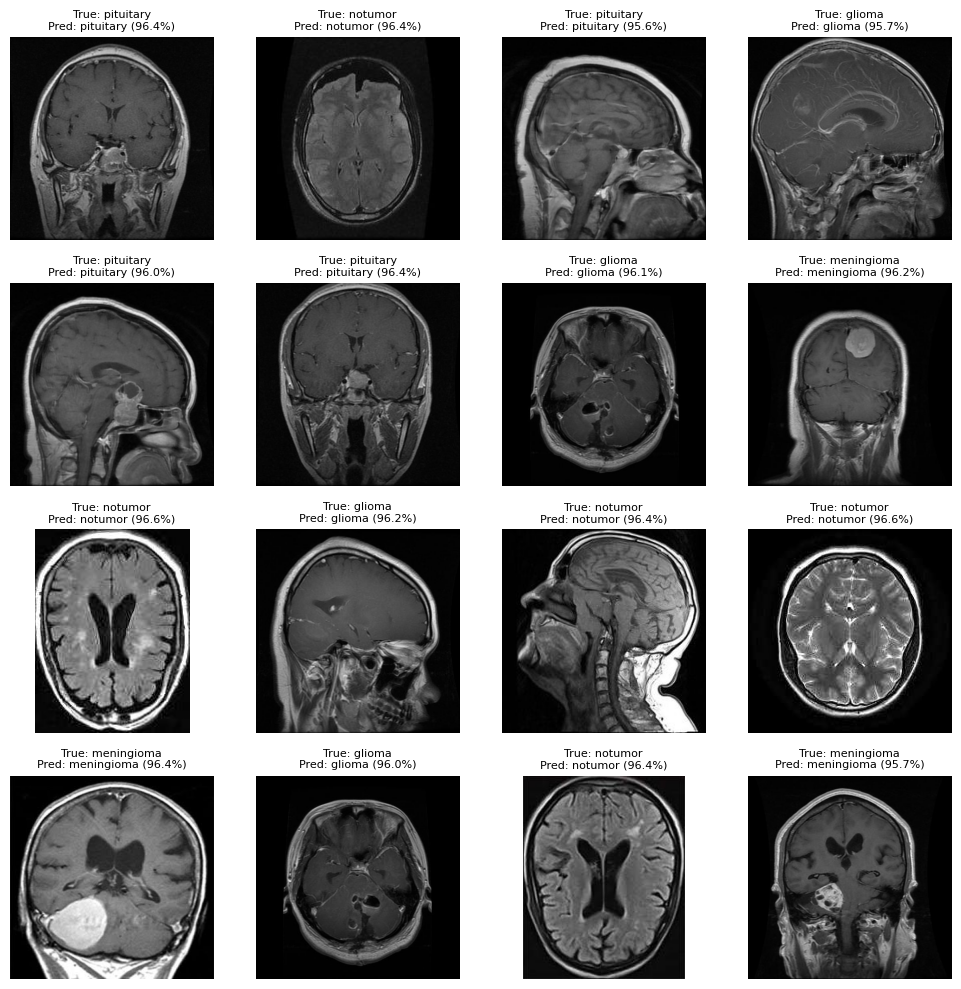

In [13]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from torchvision import transforms
from transformers import DeiTForImageClassification
import torch.nn as nn
import torch.nn.functional as F
import random

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Khởi tạo transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load mô hình DeiT
model_name = "facebook/deit-base-distilled-patch16-224"
model = DeiTForImageClassification.from_pretrained(
    model_name,
    num_labels=4,
    ignore_mismatched_sizes=True
)
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)
model_path = "/kaggle/input/deit/pytorch/default/1/deit_model_best_acc.pth"
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict)
model.to(device)
model.eval()

# Định nghĩa nhãn lớp
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

def preprocess_image(image_path):
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor
    except:
        return None, None

def predict_image(image_path):
    image, input_tensor = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, None, 0
    with torch.no_grad():
        outputs = model(input_tensor)
        logits = outputs.logits
        probs = F.softmax(logits, dim=-1)
        predicted_class = torch.argmax(probs, dim=-1).item()
        confidence = probs[0][predicted_class].item() * 100
    return image, class_labels[predicted_class], confidence

# Lấy 16 ảnh ngẫu nhiên từ thư mục Testing
testing_dir = "/kaggle/input/brain-tumor-mri-dataset/Testing"
image_paths = []
for class_name in os.listdir(testing_dir):
    class_dir = os.path.join(testing_dir, class_name)
    if os.path.isdir(class_dir):
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append((os.path.join(class_dir, img_name), class_name))

random.shuffle(image_paths)
selected_images = image_paths[:16]

# Hiển thị lưới 4x4
plt.figure(figsize=(10, 10))
for i, (image_path, true_label) in enumerate(selected_images):
    image, pred_label, confidence = predict_image(image_path)
    if image is not None:
        plt.subplot(4, 4, i + 1)
        plt.imshow(image)
        plt.title(f"True: {true_label}\nPred: {pred_label} ({confidence:.1f}%)", fontsize=8)
        plt.axis('off')
plt.tight_layout()
plt.show()

Attempting to load model (Attempt 1/3)...
✅ Model loaded successfully in 0.57 seconds!
✅ Model running on device: cuda


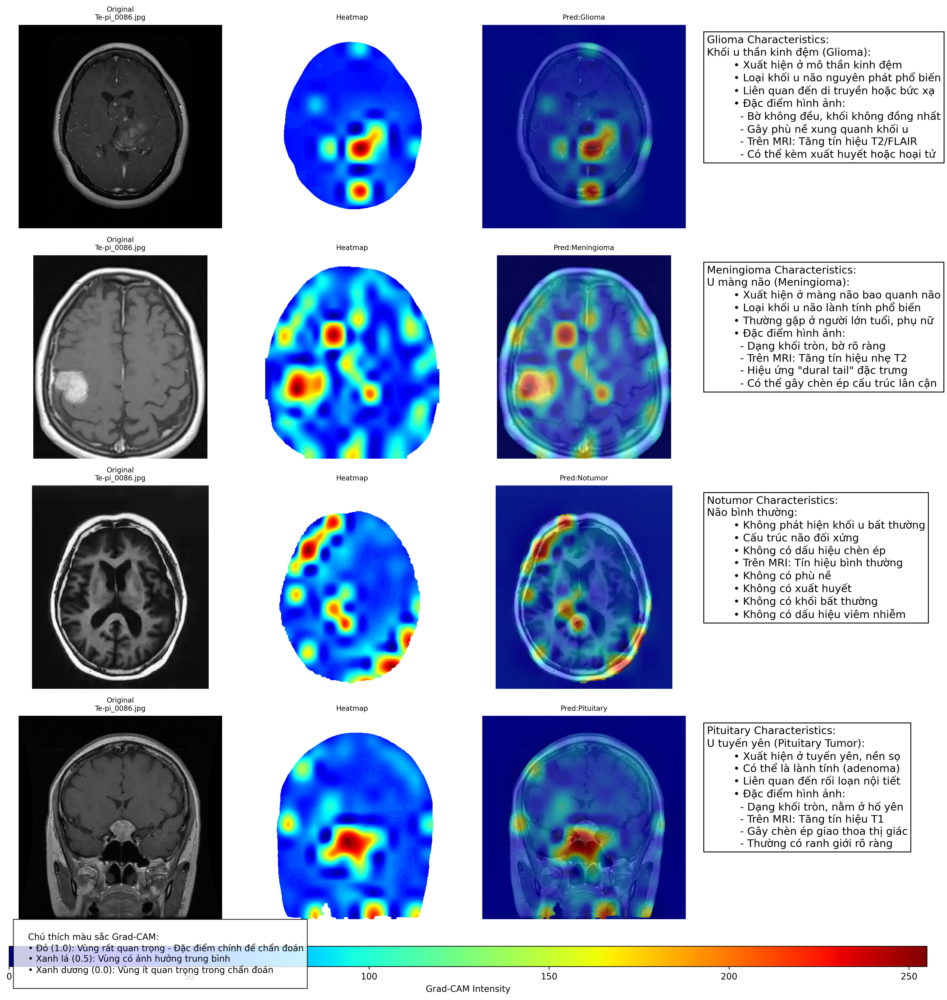


Lưu ý: Kết quả chỉ mang tính tham khảo. Hãy tham khảo ý kiến bác sĩ thần kinh để đánh giá chuyên môn!


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import DeiTImageProcessor, DeiTForImageClassification
from torchvision import transforms
from IPython.display import Image as DisplayImage, display
import uuid
from matplotlib.gridspec import GridSpec
import os
import time
import psutil
import warnings
from transformers.utils import logging

# Tắt toàn bộ cảnh báo
warnings.filterwarnings("ignore")
# Tắt log của thư viện Transformers
logging.set_verbosity_error()

# Define class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Image paths
image_paths = [
    "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0049.jpg",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0023.jpg",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-noTr_0003.jpg",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0086.jpg"
]

def get_brain_tumor_characteristics(tumor_type):
    """
    Trả về thông tin chi tiết về đặc điểm của từng loại khối u não, chuẩn hóa 9 dòng.
    """
    characteristics = {
        'glioma': """
        Khối u thần kinh đệm (Glioma):
        • Xuất hiện ở mô thần kinh đệm
        • Loại khối u não nguyên phát phổ biến
        • Liên quan đến di truyền hoặc bức xạ
        • Đặc điểm hình ảnh:
          - Bờ không đều, khối không đồng nhất
          - Gây phù nề xung quanh khối u
          - Trên MRI: Tăng tín hiệu T2/FLAIR
          - Có thể kèm xuất huyết hoặc hoại tử
        """,
        'meningioma': """
        U màng não (Meningioma):
        • Xuất hiện ở màng não bao quanh não
        • Loại khối u não lành tính phổ biến
        • Thường gặp ở người lớn tuổi, phụ nữ
        • Đặc điểm hình ảnh:
          - Dạng khối tròn, bờ rõ ràng
          - Trên MRI: Tăng tín hiệu nhẹ T2
          - Hiệu ứng "dural tail" đặc trưng
          - Có thể gây chèn ép cấu trúc lân cận
        """,
        'notumor': """
        Não bình thường:
        • Không phát hiện khối u bất thường
        • Cấu trúc não đối xứng
        • Không có dấu hiệu chèn ép
        • Trên MRI: Tín hiệu bình thường
        • Không có phù nề
        • Không có xuất huyết
        • Không có khối bất thường
        • Không có dấu hiệu viêm nhiễm
        """,
        'pituitary': """
        U tuyến yên (Pituitary Tumor):
        • Xuất hiện ở tuyến yên, nền sọ
        • Có thể là lành tính (adenoma)
        • Liên quan đến rối loạn nội tiết
        • Đặc điểm hình ảnh:
          - Dạng khối tròn, nằm ở hố yên
          - Trên MRI: Tăng tín hiệu T1
          - Gây chèn ép giao thoa thị giác
          - Thường có ranh giới rõ ràng
        """
    }
    return characteristics.get(tumor_type, "Không có thông tin")

# Initialize standard transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Initialize feature extractor for DeiT
feature_extractor = DeiTImageProcessor.from_pretrained('facebook/deit-base-distilled-patch16-224')

class DeiTGradCAM:
    def __init__(self, model, target_layer="deit.encoder.layer.11.output"):
        self.model = model
        self.target_layer = target_layer
        self.hooks = []
        self.gradients = None
        self.activations = None
        # Register hooks for the specified layer
        for name, module in model.named_modules():
            if name == target_layer:
                self.hooks.append(module.register_forward_hook(self._save_activation))
                self.hooks.append(module.register_full_backward_hook(self._save_gradient))
                break

    def _save_activation(self, module, input, output):
        if isinstance(output, tuple):
            output = output[0]
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        if isinstance(grad_output, tuple):
            grad_output = grad_output[0]
        self.gradients = grad_output.detach()

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()
        self.hooks = []

    def generate_cam(self, input_tensor, target_class=None):
        self.model.eval()
        self.model.zero_grad()
        outputs = self.model(input_tensor)
        logits = outputs.logits
        softmax_scores = torch.softmax(logits, dim=1)[0]

        if target_class is None:
            target_class = torch.argmax(logits, dim=1).item()

        # Backward pass for the target class
        self.model.zero_grad()
        one_hot = torch.zeros_like(logits)
        one_hot[0, target_class] = 1
        logits.backward(gradient=one_hot, retain_graph=True)

        # Compute Grad-CAM
        gradients = self.gradients
        activations = self.activations

        if gradients is None or activations is None:
            raise ValueError("Gradients or activations not captured.")

        # Compute weights from gradients
        weights = torch.mean(gradients, dim=2)[0][2:]  # Mean pooling over patches (excluding CLS token)
        activations = activations[:, 2:, :]  # Exclude CLS token
        cam = torch.einsum('bs,bsh->bh', weights.unsqueeze(0), activations)[0].cpu().numpy()

        # Reshape to 2D heatmap
        side_len = int(np.sqrt(cam.shape[0]))
        cam = cam.reshape(side_len, side_len)
        cam = np.maximum(cam, 0)  # ReLU
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)  # Normalize
        cam = cv2.resize(cam, (224, 224), interpolation=cv2.INTER_CUBIC)

        predicted_class = target_class
        confidence = softmax_scores[predicted_class].item()
        return cam, confidence, predicted_class

def load_custom_model(model_path, num_classes=4, max_retries=3, retry_delay=5):
    model = DeiTForImageClassification.from_pretrained('facebook/deit-base-distilled-patch16-224')
    model.classifier = torch.nn.Sequential(
        torch.nn.Dropout(0.3),
        torch.nn.Linear(model.config.hidden_size, num_classes)
    )
    
    mem = psutil.virtual_memory()
    if mem.available < 2 * 1024 * 1024 * 1024:
        warnings.warn("Low memory detected (<2GB). Model loading may fail or be slow.")

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    map_location = device

    for attempt in range(max_retries):
        try:
            print(f"Attempting to load model (Attempt {attempt + 1}/{max_retries})...")
            start_time = time.time()
            checkpoint = torch.load(model_path, map_location=map_location, weights_only=True)
            model.load_state_dict(checkpoint, strict=False)
            print(f"✅ Model loaded successfully in {time.time() - start_time:.2f} seconds!")
            break
        except Exception as e:
            print(f"❌ Error loading model: {e}")
            if attempt < max_retries - 1:
                print(f"Retrying in {retry_delay} seconds...")
                time.sleep(retry_delay)
            else:
                warnings.warn("Failed with weights_only=True. Falling back to weights_only=False (less secure).")
                try:
                    checkpoint = torch.load(model_path, map_location=map_location, weights_only=False)
                    model.load_state_dict(checkpoint, strict=False)
                    print("✅ Model loaded successfully with weights_only=False!")
                except Exception as e:
                    print(f"❌ Failed to load model: {e}")
                    print("⚠️ Continuing with base model...")
    model.eval()
    return model

def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0)
    return image, input_tensor

def visualize_detection(image_path, model):
    image, input_tensor = preprocess_image(image_path)
    original_size = (image.width, image.height)
    device = next(model.parameters()).device
    input_tensor = input_tensor.to(device)
    
    gradcam = DeiTGradCAM(model, target_layer="deit.encoder.layer.11.output")
    cam, confidence, pred_class_idx = gradcam.generate_cam(input_tensor)
    gradcam.remove_hooks()
    class_name = class_labels[pred_class_idx]
    
    # Resize heatmap to original image size
    cam_resized = cv2.resize(cam, original_size, interpolation=cv2.INTER_CUBIC)
    
    # Convert heatmap to colored heatmap
    heatmap_uint8 = np.uint8(255 * cam_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
    # Overlay heatmap on original image
    image_np = np.array(image)
    alpha = 0.5
    final_heatmap = cv2.addWeighted(image_np, 1-alpha, heatmap_colored_rgb, alpha, 0)
    
    return {
        "original_image": image,
        "heatmap": heatmap_colored_rgb,
        "overlay": final_heatmap,
        "class_name": class_name,
        "confidence": confidence
    }

def detect_brain_tumor_4x3(model_path, image_paths):
    model = load_custom_model(model_path)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    print(f"✅ Model running on device: {device}")

    results = []
    for image_path in image_paths:
        result = visualize_detection(image_path, model)
        results.append(result)

    fig = plt.figure(figsize=(16, 12))
    gs = GridSpec(5, 4, height_ratios=[1, 1, 1, 1, 0.1], figure=fig)

    for i, (result, true_class) in enumerate(zip(results, class_labels)):
        ax0 = plt.subplot(gs[i, 0])
        ax0.imshow(result["original_image"])
        ax0.set_title(f"Original\n{os.path.basename(image_path)}", fontsize=8)
        ax0.axis("off")
        ax0.set_aspect('equal')
        for spine in ax0.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        ax1 = plt.subplot(gs[i, 1])
        im = ax1.imshow(result["heatmap"], cmap='jet')
        ax1.set_title("Heatmap", fontsize=8)
        ax1.axis("off")
        ax1.set_aspect('equal')
        for spine in ax1.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        ax2 = plt.subplot(gs[i, 2])
        ax2.imshow(result["overlay"])
        ax2.set_title(f"Pred:{result['class_name'].capitalize()}", fontsize=8)
        ax2.axis("off")
        ax2.set_aspect('equal')
        for spine in ax2.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        ax3 = plt.subplot(gs[i, 3])
        characteristics = get_brain_tumor_characteristics(result['class_name'])
        characteristics_text = f"{result['class_name'].capitalize()} Characteristics:\n{characteristics.strip()}"
        ax3.text(0.01, 0.95, characteristics_text, fontsize=12, verticalalignment='top',
                 bbox=dict(boxstyle='square', facecolor='white', edgecolor='black', linewidth=1))
        ax3.axis("off")

    cbar_ax = plt.subplot(gs[-1, :])
    plt.colorbar(im, cax=cbar_ax, orientation='horizontal', label='Grad-CAM Intensity', cmap='jet')

    text_str = """
    Chú thích màu sắc Grad-CAM:
    • Đỏ (1.0): Vùng rất quan trọng - Đặc điểm chính để chẩn đoán
    • Xanh lá (0.5): Vùng có ảnh hưởng trung bình
    • Xanh dương (0.0): Vùng ít quan trọng trong chẩn đoán
    """
    plt.figtext(0.02, 0.02, text_str, fontsize=10, bbox=dict(facecolor='white', alpha=0.8))

    output_filename = f'detection_output_4x3_{uuid.uuid4().hex}.png'
    plt.tight_layout()
    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    plt.close(fig)
    display(DisplayImage(filename=output_filename, width=900, height=1200))

    summary_path = "multi_result_summary.txt"
    with open(summary_path, "w") as f:
        f.write("📊 Multi-Image Prediction Summary:\n")
        for image_path, true_class in zip(image_paths, class_labels):
            result = visualize_detection(image_path, model)
            f.write(f"\nImage: {os.path.basename(image_path)}\n")
            f.write(f"Predicted Class: {result['class_name']}\n")
            f.write(f"Confidence: {result['confidence']*100:.2f}%\n")
            f.write(f"Characteristics:\n{get_brain_tumor_characteristics(result['class_name'])}\n")
            f.write("-"*50 + "\n")

    print("\nLưu ý: Kết quả chỉ mang tính tham khảo. Hãy tham khảo ý kiến bác sĩ thần kinh để đánh giá chuyên môn!")
    return results

if __name__ == "__main__":
    model_path = "/kaggle/input/deit/pytorch/default/2/deit_model_best_acc.pth"
    results = detect_brain_tumor_4x3(model_path, image_paths)

Using device: cuda
✅ Mô hình đã được tải thành công!


Tính toán Integrated Gradients (Te-me_0114.jpg): 100%|██████████| 300/300 [00:09<00:00, 31.84it/s]
Tính toán Integrated Gradients (Te-noTr_0009.jpg): 100%|██████████| 300/300 [00:09<00:00, 31.29it/s]
Tính toán Integrated Gradients (Te-pi_0041.jpg): 100%|██████████| 300/300 [00:09<00:00, 30.82it/s]


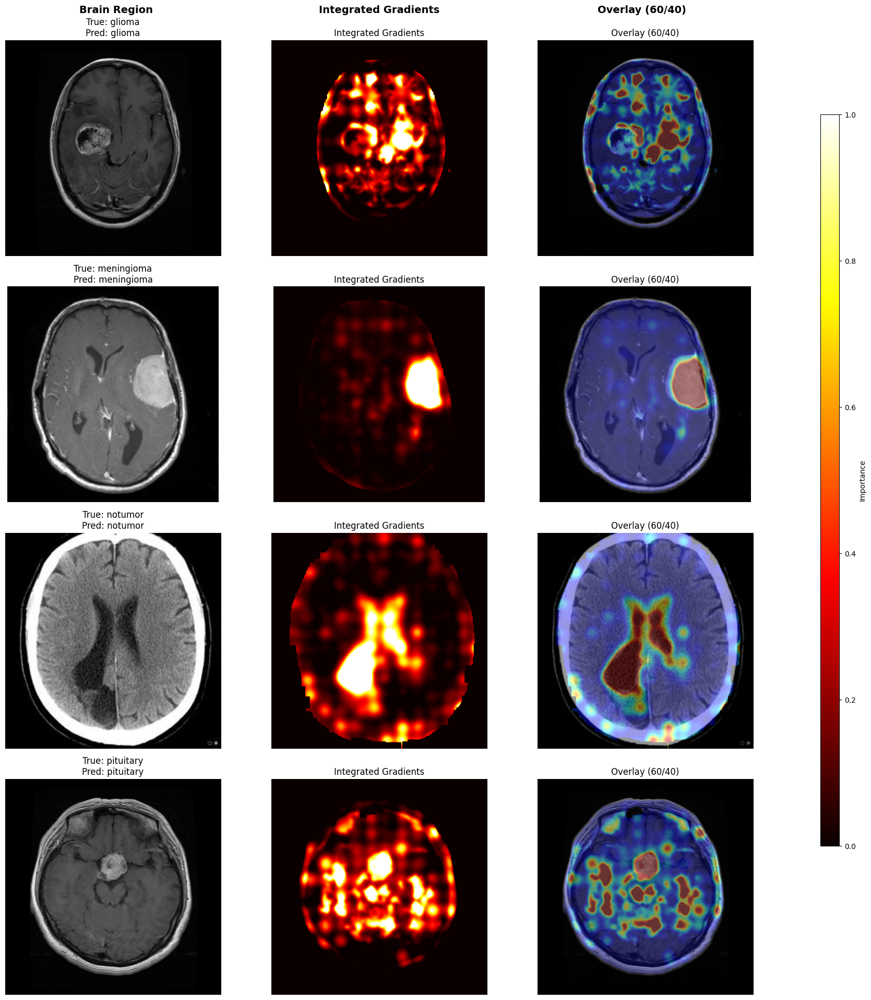

In [4]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import DeiTForImageClassification
import torch.nn.functional as F
from scipy.ndimage import gaussian_filter
from tqdm import tqdm
import torch.nn as nn
from torchvision import transforms

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/visualization_results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load model
model_name = "facebook/deit-base-distilled-patch16-224"
model = DeiTForImageClassification.from_pretrained(
    model_name,
    num_labels=4,
    ignore_mismatched_sizes=True
)
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)
model_path = "/kaggle/input/deit/pytorch/default/2/deit_model_best_acc.pth"
try:
    state_dict = torch.load(model_path, map_location=device, weights_only=True)
    model.load_state_dict(state_dict, strict=False)
    print("✅ Mô hình đã được tải thành công!")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    exit(1)
model.to(device)
model.eval()

def segment_brain_region(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image

    _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        mask = np.zeros_like(gray)
        cv2.drawContours(mask, [largest_contour], -1, 255, -1)
        x, y, w, h = cv2.boundingRect(largest_contour)
        padding = 20
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = min(gray.shape[1] - x, w + 2*padding)
        h = min(gray.shape[0] - y, h + 2*padding)
        if len(image.shape) == 3:
            return image[y:y+h, x:x+w], (x, y, w, h)
        return gray[y:y+h, x:x+w], (x, y, w, h)
    return image, (0, 0, image.shape[1], image.shape[0])

def create_brain_mask(brain_region, target_size):
    if len(brain_region.shape) == 3:
        gray = cv2.cvtColor(brain_region, cv2.COLOR_RGB2GRAY)
    else:
        gray = brain_region.copy()

    _, mask = cv2.threshold(gray, 10, 1, cv2.THRESH_BINARY)
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.erode(mask, kernel, iterations=2)
    mask = cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)
    return mask

def create_distance_penalty(shape, power=0.5, pituitary_focus=False):
    h, w = shape
    y, x = np.ogrid[:h, :w]
    if pituitary_focus:
        center_y, center_x = int(h * 0.5), w // 2
    else:
        center_y, center_x = h // 2, w // 2
    distance_from_center = np.sqrt((x - center_x)**2 + (y - center_y)**2)
    max_distance = np.sqrt((center_x)**2 + (center_y)**2)
    distance_penalty = 1 - (distance_from_center / max_distance)**power
    return distance_penalty

def create_pituitary_mask(shape):
    h, w = shape
    mask = np.zeros((h, w), dtype=np.float32)
    y, x = np.ogrid[:h, :w]
    center_y, center_x = h // 2, w // 2
    sigma_y, sigma_x = h / 4, w / 4
    mask = np.exp(-((x - center_x)**2 / (2 * sigma_x**2) + (y - center_y)**2 / (2 * sigma_y**2)))
    mask = gaussian_filter(mask, sigma=5.0)
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask

def enhance_bright_regions(image, threshold_percentile=85, sigma=3.0):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image

    gray = gray.astype(np.float32) / 255.0
    threshold = np.percentile(gray, threshold_percentile)
    bright_mask = (gray > threshold).astype(np.float32)
    bright_mask = gaussian_filter(bright_mask, sigma=sigma)
    bright_mask = (bright_mask - bright_mask.min()) / (bright_mask.max() - bright_mask.min() + 1e-8)
    return bright_mask

def preprocess_image(image, transform):
    try:
        input_tensor = transform(image).unsqueeze(0).to(device)
        return input_tensor
    except Exception as e:
        print(f"Error preprocessing image: {str(e)}")
        return None
def integrated_gradients_visualization(image_path, model, transform, steps=300, sigma=3.0, only_brain=True):
    class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

    original_image = Image.open(image_path).convert("RGB")
    original_np = np.array(original_image)

    if only_brain:
        brain_region, bbox = segment_brain_region(original_np)
        brain_image = Image.fromarray(brain_region)
    else:
        brain_image = original_image
        brain_region = original_np

    target_size = original_np.shape[:2][::-1]

    img_tensor = preprocess_image(brain_image, transform)
    if img_tensor is None:
        print(f"Failed to preprocess image {image_path}")
        return None, None, None, None

    img_tensor = img_tensor.requires_grad_(True)

    with torch.no_grad():
        outputs = model(img_tensor)
        logits = outputs.logits
        probs = F.softmax(logits, dim=-1)
        pred_class = torch.argmax(probs, dim=-1).item()

    baseline = torch.zeros_like(img_tensor)
    integrated_grads = torch.zeros_like(img_tensor)
    for alpha in tqdm(np.linspace(0, 1, steps), desc=f"Tính toán Integrated Gradients ({os.path.basename(image_path)})"):
        interpolated_img = baseline + alpha * (img_tensor - baseline)
        interpolated_img.requires_grad_(True)
        outputs = model(interpolated_img)
        grads = torch.autograd.grad(outputs.logits[0, pred_class], interpolated_img)[0]
        integrated_grads += grads / steps

    attribution = (img_tensor - baseline) * integrated_grads
    attribution = attribution.sum(dim=1).detach().cpu().numpy().squeeze()
    # Tăng sigma cho meningioma, notumor, pituitary
    sigma_smooth = 3.0 if class_labels[pred_class] == "glioma" else 4.0
    attribution = gaussian_filter(np.abs(attribution), sigma=sigma_smooth)

    attribution = cv2.resize(attribution, target_size, interpolation=cv2.INTER_CUBIC)
    brain_mask = create_brain_mask(original_np, target_size)
    attribution = attribution * brain_mask

    pituitary_focus = (class_labels[pred_class] == "pituitary")
    distance_penalty = create_distance_penalty((target_size[1], target_size[0]), power=0.7, pituitary_focus=pituitary_focus)
    attribution = attribution * distance_penalty

    if class_labels[pred_class] in ["pituitary", "meningioma", "glioma"]:
        bright_mask = enhance_bright_regions(original_np, threshold_percentile=85, sigma=3.0 if class_labels[pred_class] == "glioma" else 4.0)
        bright_mask = cv2.resize(bright_mask, target_size, interpolation=cv2.INTER_NEAREST)
        attribution = attribution * (1 + 3.0 * bright_mask)

    if class_labels[pred_class] == "pituitary":
        pituitary_mask = create_pituitary_mask((target_size[1], target_size[0]))
        attribution = attribution * (1 + 2.0 * pituitary_mask)

    vmin, vmax = np.percentile(attribution[attribution > 0], [15, 95])
    attribution_norm = np.clip((attribution - vmin) / (vmax - vmin + 1e-8), 0, 1)
    attribution_norm = attribution_norm * brain_mask

    heatmap = cv2.applyColorMap(np.uint8(255 * attribution_norm), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0

    brain_np = original_np / 255.0
    overlay = 0.6 * brain_np + 0.4 * heatmap * np.expand_dims(brain_mask, axis=2)
    overlay = np.clip(overlay, 0, 1)

    return original_np, attribution_norm, overlay, class_labels[pred_class]

def integrated_gradients_visualization_multiple(image_paths, model, transform, steps=300, sigma=3.0, save_dir=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    # Create 4x3 subplot grid
    fig, axes = plt.subplots(4, 3, figsize=(18, 20))
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position for shared colorbar

    for row, image_path in enumerate(image_paths):
        # Extract true label from filename
        label = os.path.basename(image_path).split('-')[1]
        if label.startswith("gl"):
            label = "glioma"
        elif label.startswith("me"):
            label = "meningioma"
        elif label.startswith("no"):
            label = "notumor"
        elif label.startswith("pi"):
            label = "pituitary"
        else:
            label = "unknown"

        # Compute integrated gradients
        original_np, attribution_norm, overlay, pred_class = integrated_gradients_visualization(
            image_path, model, transform, steps=steps, sigma=sigma, only_brain=True
        )

        if original_np is None:
            print(f"Failed to process image {image_path}")
            axes[row, 0].axis("off")
            axes[row, 1].axis("off")
            axes[row, 2].axis("off")
            continue

        # Plot Brain Region
        axes[row, 0].imshow(original_np)
        axes[row, 0].set_title(f"True: {label}\nPred: {pred_class}")
        axes[row, 0].axis("off")

        # Plot Integrated Gradients
        im = axes[row, 1].imshow(attribution_norm, cmap="hot", vmin=0, vmax=1)
        axes[row, 1].set_title("Integrated Gradients")
        axes[row, 1].axis("off")

        # Plot Overlay
        axes[row, 2].imshow(overlay)
        axes[row, 2].set_title("Overlay (60/40)")
        axes[row, 2].axis("off")

        # Add shared colorbar (only once, after the first valid heatmap)
        if row == 0 and attribution_norm is not None:
            fig.colorbar(im, cax=cbar_ax, label="Importance", orientation='vertical')

    # Add column titles
    column_titles = ["Brain Region", "Integrated Gradients", "Overlay (60/40)"]
    for col, title in enumerate(column_titles):
        fig.text(0.17 + col * 0.28, 0.95, title, ha='center', va='center', fontsize=14, fontweight='bold')

    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    if save_dir:
        save_path = os.path.join(save_dir, "integrated_gradients_4x3.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0028.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0114.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-noTr_0009.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0041.jpg"
    ]
    integrated_gradients_visualization_multiple(image_paths, model, transform, save_dir=save_dir)

In [2]:
!pip install lime

Using device: cuda


Some weights of DeiTForImageClassification were not initialized from the model checkpoint at facebook/deit-base-distilled-patch16-224 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


LIME model loaded successfully with partial weights.


Some weights of DeiTForImageClassification were not initialized from the model checkpoint at facebook/deit-base-distilled-patch16-224 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Classification model loaded successfully!
Creating 4x4 LIME and Classification grid...

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg
Image loaded successfully: (512, 512, 3)
Segmentation done: 100 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0030.jpg
Image loaded successfully: (303, 252, 3)
Segmentation done: 106 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0016.jpg
Image loaded successfully: (218, 236, 3)
Segmentation done: 95 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-piTr_0008.jpg
Image loaded successfully: (512, 512, 3)
Segmentation done: 108 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Grid saved to /kaggle/working/results/lime_4x4_grid.png


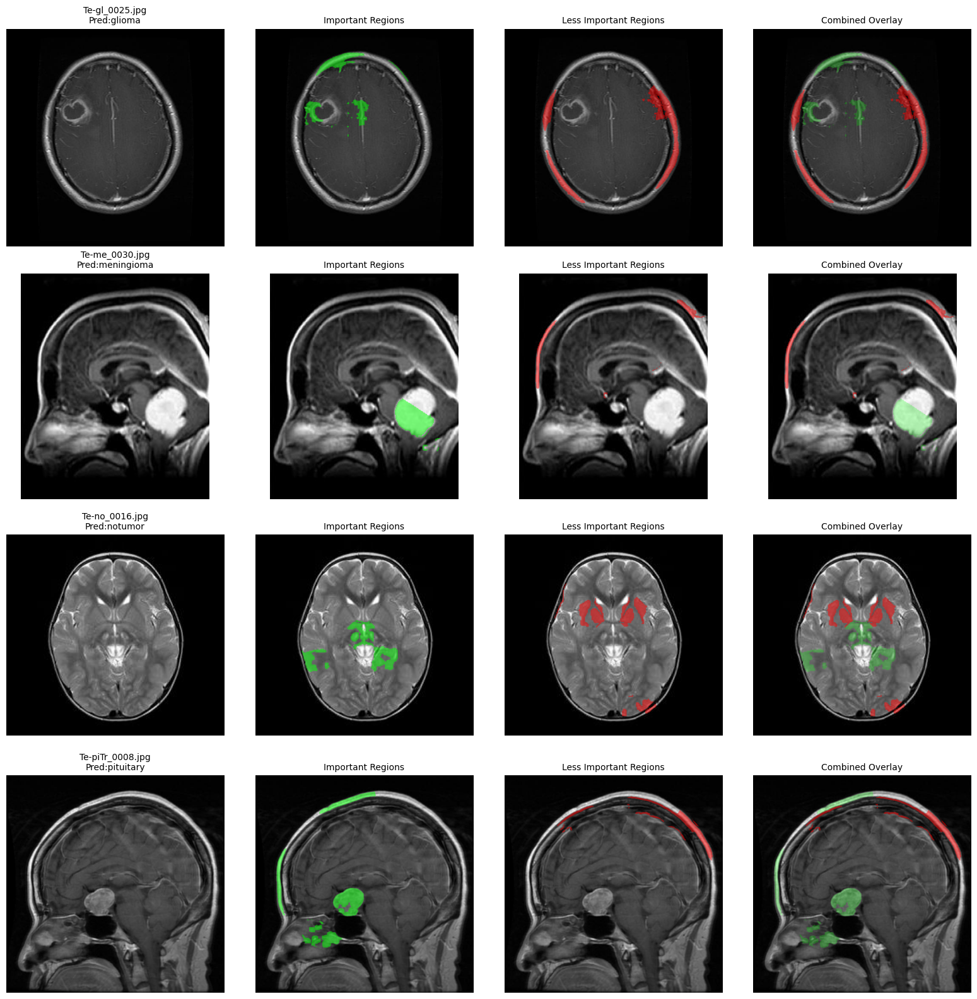

In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from lime import lime_image
from skimage.segmentation import slic
import cv2
from transformers import DeiTImageProcessor, DeiTForImageClassification
from torchvision import transforms
import os
import torch.nn as nn
import torch.nn.functional as F
import IPython.display as display
import uuid

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/kaggle/working/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform cho classification
transform_classify = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Khởi tạo feature extractor cho LIME
feature_extractor = DeiTImageProcessor.from_pretrained("facebook/deit-base-distilled-patch16-224")

# Class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Initialize DeiT model for LIME
def initialize_deit_model_lime():
    model = DeiTForImageClassification.from_pretrained(
        "facebook/deit-base-distilled-patch16-224",
        num_labels=4,
        output_hidden_states=True,
        ignore_mismatched_sizes=True
    )
    model_path = "/kaggle/input/deit/pytorch/default/1/deit_model_best.pth"
    if not os.path.exists(model_path):
        print(f"Warning: LIME model file not found at {model_path}")
        return model
    try:
        custom_weights = torch.load(model_path, map_location=device, weights_only=True)
        new_state_dict = {}
        model_state_dict = model.state_dict()
        for key in model_state_dict.keys():
            if key in custom_weights and model_state_dict[key].shape == custom_weights[key].shape:
                new_state_dict[key] = custom_weights[key]
        model.load_state_dict(new_state_dict, strict=False)
        print("LIME model loaded successfully with partial weights.")
    except Exception as e:
        print(f"Error loading LIME model: {e}")
    return model

# Initialize DeiT model for classification
def initialize_deit_model_classify():
    model = DeiTForImageClassification.from_pretrained(
        "facebook/deit-base-distilled-patch16-224",
        num_labels=4,
        ignore_mismatched_sizes=True
    )
    model.classifier = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(model.config.hidden_size, model.config.num_labels)
    )
    model_path = "/kaggle/input/deit/pytorch/default/1/deit_model_best_acc.pth"
    try:
        state_dict = torch.load(model_path, map_location=device, weights_only=True)
        model.load_state_dict(state_dict)
        print("Classification model loaded successfully!")
    except Exception as e:
        print(f"Error loading classification model: {e}")
        return None
    return model

# Load models
model_lime = initialize_deit_model_lime()
model_lime.to(device).eval()
model_classify = initialize_deit_model_classify()
if model_classify is None:
    print("Failed to load classification model. Exiting.")
    exit(1)
model_classify.to(device).eval()

# Preprocess for classification
def preprocess_image_classify(image_path):
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform_classify(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

# Predict single image for classification
def predict_single_image(image_path):
    image, input_tensor = preprocess_image_classify(image_path)
    if image is None or input_tensor is None:
        return None, 0, None
    try:
        with torch.no_grad():
            outputs = model_classify(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100
        predicted_label = class_labels[predicted_class]
        result_path = os.path.join(save_dir, f"{os.path.basename(image_path).split('.')[0]}_classify_result.jpg")
        plt.figure(figsize=(10, 5))
        image_cv2 = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        plt.subplot(1, 2, 1)
        plt.imshow(image_cv2)
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        class_probs = probs[0].cpu().numpy() * 100
        colors = ['lightcoral' if i != predicted_class else 'lightgreen' for i in range(len(class_labels))]
        plt.bar(class_labels, class_probs, color=colors)
        plt.title(f'Class Probabilities\nPredicted: {predicted_label}')
        plt.xticks(rotation=45)
        plt.ylabel('Confidence (%)')
        plt.tight_layout()
        plt.savefig(result_path)
        plt.close()
        return predicted_label, confidence, image
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0, None

# Batch prediction for LIME
def batch_predict(images):
    model_lime.eval()
    probs = np.zeros((len(images), len(class_labels)))
    for i, img in enumerate(images):
        img_pil = Image.fromarray(np.uint8(img))
        inputs = feature_extractor(images=img_pil, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model_lime(**inputs)
            probs[i] = F.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs

# Image segmentation for LIME
def segment_image(image, n_segments=100, compactness=10):
    segments = slic(image, n_segments=n_segments, compactness=compactness, sigma=1.0, start_label=1,
                    enforce_connectivity=True, min_size_factor=0.1)
    return segments

# LIME explanation function
def-guard explain_with_lime_for_deit(image_path, pred_class, num_samples=1000):
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}")
        return None, None, None
    try:
        img = Image.open(image_path).convert("RGB")
        img_np = np.array(img)
        print(f"Image loaded successfully: {img_np.shape}")
        segments = segment_image(img_np, n_segments=100, compactness=10)
        print(f"Segmentation done: {len(np.unique(segments))} segments")
        explainer = lime_image.LimeImageExplainer()
        print("Running LIME explanation...")
        top_label = class_labels.index(pred_class)
        explanation = explainer.explain_instance(
            img_np,
            batch_predict,
            segmentation_fn=lambda x: segments,
            top_labels=None,
            labels=(top_label,),
            hide_color=0,
            num_samples=num_samples
        )
        print("LIME explanation completed!")
        segment_importance = explanation.local_exp[top_label]
        importance_map = np.zeros(segments.shape)
        for segment_id, weight in segment_importance:
            importance_map[segments == segment_id] = weight
        # Normalize importance map for visualization
        importance_map = (importance_map - importance_map.min()) / (importance_map.max() - importance_map.min() + 1e-8)
        positive_regions = np.copy(img_np)
        negative_regions = np.copy(img_np)
        positive_mask = (importance_map > 0).astype(np.uint8) * 255
        negative_mask = (importance_map < 0).astype(np.uint8) * 255
        for c in range(3):
            positive_regions[:, :, c] = np.where(
                positive_mask > 0,
                (0.5 * np.array([0, 255, 0])[c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )
            negative_regions[:, :, c] = np.where(
                negative_mask > 0,
                (0.5 * np.array([255, 0, 0])[c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )
        return img_np, positive_regions, negative_regions
    except Exception as e:
        print(f"Error during LIME explanation for {image_path}: {e}")
        return None, None, None

# Create 4x4 grid with classification and LIME
def create_4x4_grid(image_paths):
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    plt.tight_layout(pad=1.0, w_pad=0.5, h_pad=0.5)
    for row, image_path in enumerate(image_paths):
        print(f"\nProcessing image: {image_path}")
        pred_label, pred_confidence, image = predict_single_image(image_path)
        if pred_label is None:
            print(f"Skipping {image_path} due to classification error.")
            for col in range(4):
                axes[row, col].axis("off")
                axes[row, col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
            continue
        img_np, positive_regions, negative_regions = explain_with_lime_for_deit(
            image_path, pred_class=pred_label, num_samples=1000
        )
        if img_np is None:
            print(f"Skipping {image_path} due to LIME error.")
            for col in range(4):
                axes[row, col].axis("off")
                axes[row, col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
            continue
        axes[row, 0].imshow(img_np)
        axes[row, 0].set_title(f"{os.path.basename(image_path)}\nPred:{pred_label}", fontsize=10)
        axes[row, 0].axis("off")
        axes[row, 1].imshow(positive_regions)
        axes[row, 1].set_title("Positive Regions", fontsize=10)
        axes[row, 1].axis("off")
        axes[row, 2].imshow(negative_regions)
        axes[row, 2].set_title("Negative Regions", fontsize=10)
        axes[row, 2].axis("off")
        combined_image = np.copy(img_np)
        positive_mask = (positive_regions.sum(axis=2) > img_np.sum(axis=2)).astype(np.uint8) * 255
        negative_mask = (negative_regions.sum(axis=2) > img_np.sum(axis=2)).astype(np.uint8) * 255
        alpha = 0.5
        for c in range(3):
            combined_image[:, :, c] = np.where(
                positive_mask > 0,
                (alpha * positive_regions[:, :, c] + (1 - alpha) * img_np[:, :, c]).astype(np.uint8),
                combined_image[:, :, c]
            )
            combined_image[:, :, c] = np.where(
                negative_mask > 0,
                (alpha * negative_regions[:, :, c] + (1 - alpha) * img_np[:, :, c]).astype(np.uint8),
                combined_image[:, :, c]
            )
        axes[row, 3].imshow(combined_image)
        axes[row, 3].set_title("Combined Overlay", fontsize=10)
        axes[row, 3].axis("off")
    result_path = os.path.join(save_dir, f"lime_4x4_grid_{uuid.uuid4().hex}.png")
    plt.savefig(result_path, bbox_inches="tight", dpi=300)
    plt.close()
    print(f"\nGrid saved to {result_path}")
    display.display(display.Image(result_path))

# Main execution
if __name__ == "__main__":
    print("Creating 4x4 LIME and Classification grid...")
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0030.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0016.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-piTr_0008.jpg"
    ]
    for path in image_paths:
        if not os.path.exists(path):
            print(f"Warning: Image not found at {path}")
    create_4x4_grid(image_paths)

Using device: cuda


Some weights of DeiTForImageClassification were not initialized from the model checkpoint at facebook/deit-base-distilled-patch16-224 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ Mô hình DeiT đã được tải thành công!


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [02:28, 148.88s/it]              


Shape giá trị SHAP: (1, 154, 154, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 154, 154, 4)
Tổng giá trị SHAP tích cực: 0.48343646932012796
Tổng giá trị SHAP tiêu cực: 0.8061783613056107


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:25, 205.10s/it]              


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 0.7144490499156262
Tổng giá trị SHAP tiêu cực: 0.1296606196342593


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:49, 229.72s/it]              


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 0.6641192606990102
Tổng giá trị SHAP tiêu cực: 0.11051829029540025


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:17, 197.22s/it]              


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 0.5783365570704062
Tổng giá trị SHAP tiêu cực: 0.08236890499989133


This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


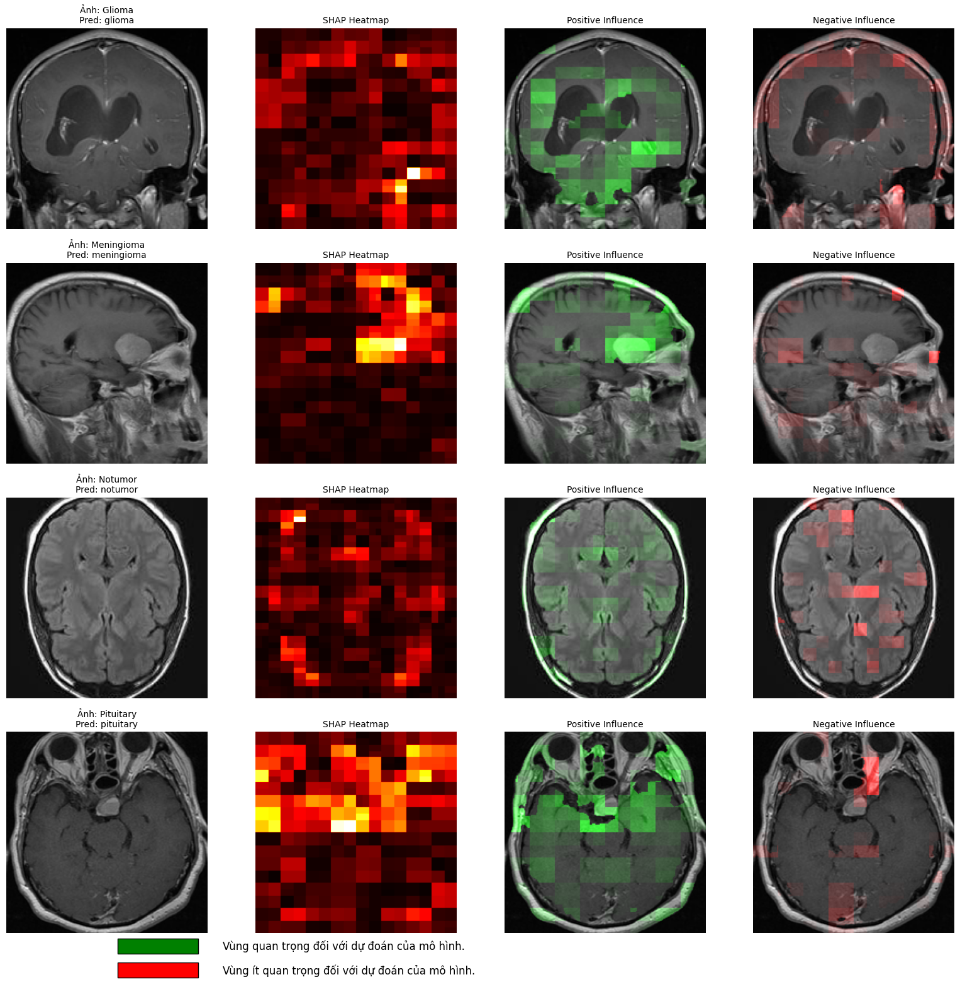

In [5]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import shap
import cv2
from transformers import DeiTForImageClassification, AutoImageProcessor, DeiTConfig
from skimage.segmentation import slic
from skimage.color import label2rgb
import torch.nn as nn
from torchvision import transforms
import torch.nn.functional as F
import matplotlib.patches as patches

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/deit/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform chuẩn
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load model DeiT
MODEL_NAME = "facebook/deit-base-distilled-patch16-224"
model = DeiTForImageClassification.from_pretrained(
    MODEL_NAME,
    num_labels=4,
    ignore_mismatched_sizes=True
)

# Định nghĩa lại classifier
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)

# Tải state_dict
model_path = "/kaggle/input/deit/pytorch/default/1/deit_model_best_acc.pth"
try:
    state_dict = torch.load(model_path, map_location=device, weights_only=True)
    state_dict_no_module = {}
    for key, value in state_dict.items():
        new_key = key.replace('module.', '')
        if new_key == "classifier.weight":
            state_dict_no_module["classifier.0.weight"] = value
        elif new_key == "classifier.bias":
            state_dict_no_module["classifier.0.bias"] = value
        else:
            state_dict_no_module[new_key] = value
    model.load_state_dict(state_dict_no_module, strict=True)
    print("✅ Mô hình DeiT đã được tải thành công!")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    exit(1)

# Chuyển mô hình sang thiết bị và đặt chế độ eval
model.to(device)
model.eval()

# Định nghĩa nhãn lớp khối u não
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]
num_classes = len(class_labels)

# Hàm cắt rìa ảnh
def crop_image(img_array, image_path, margin=20, glioma_margin=35):
    """Cắt bỏ rìa ảnh để loại bỏ vùng không liên quan, margin đặc biệt cho Glioma."""
    height, width = img_array.shape[:2]
    # Áp dụng margin 40 cho Glioma, margin mặc định cho các lớp khác
    effective_margin = glioma_margin if "glioma" in image_path.lower() else margin
    # Đảm bảo margin không vượt quá kích thước ảnh
    effective_margin = min(effective_margin, height // 2 - 1, width // 2 - 1)
    return img_array[effective_margin:height-effective_margin, effective_margin:width-effective_margin]

# Hàm tiền xử lý ảnh
def preprocess_image(image_path):
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None, None
    try:
        image = Image.open(image_path).convert("RGB")
        # Resize trước khi cắt
        image = image.resize((224, 224), Image.LANCZOS)
        img_array = np.array(image)
        # Cắt rìa với margin phù hợp
        img_array = crop_image(img_array, image_path)
        image = Image.fromarray(img_array)
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor, img_array
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None, None

# Hàm dự đoán
def predict_single_image(image_path, model):
    image, input_tensor, _ = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, 0

    try:
        with torch.no_grad():
            outputs = model(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100

        predicted_label = class_labels[predicted_class]

        return predicted_label, confidence

    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0

# Khởi tạo mô hình và tham số
def initialize_model_and_params(save_dir=None, device=None, processor=None, model=None, model_path=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    if processor is None:
        processor = AutoImageProcessor.from_pretrained(MODEL_NAME)

    if model is None:
        global_model = globals().get('model')
        if global_model is not None:
            model = global_model.to(device)
        else:
            raise ValueError("No global model found and no model provided!")
    else:
        model.to(device)

    return save_dir, device, processor, model

# Phân vùng ảnh
def segment_image(image, n_segments=1500, compactness=20):
    if isinstance(image, str):
        image = np.array(Image.open(image).convert("RGB"))
    elif isinstance(image, Image.Image):
        image = np.array(image)

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    segments = slic(
        image,
        n_segments=n_segments,
        compactness=compactness,
        sigma=1.0,
        start_label=1,
        enforce_connectivity=True,
        min_size_factor=0.01
    )
    return segments

# Wrapper cho mô hình DeiT
class DeiTWrapper:
    def __init__(self, model, processor, device, num_classes):
        self.model = model
        self.processor = processor
        self.device = device
        self.num_classes = num_classes
        self.model.eval()

    def __call__(self, images):
        if isinstance(images, np.ndarray) and len(images.shape) == 3:
            images = [images]

        batch_probs = []
        for img in images:
            img_pil = Image.fromarray(np.uint8(img)) if isinstance(img, np.ndarray) else img
            inputs = self.processor(images=img_pil, return_tensors="pt").to(self.device)

            with torch.no_grad():
                outputs = self.model(**inputs).logits
                probs = torch.nn.functional.softmax(outputs, dim=1).cpu().numpy()[0]
                if probs.shape[0] != self.num_classes:
                    raise ValueError(f"Đầu ra mô hình có {probs.shape[0]} lớp, nhưng kỳ vọng {self.num_classes}")
                batch_probs.append(probs)

        return np.array(batch_probs)

# Hàm giải thích bằng SHAP
def explain_with_shap(image_path, n_segments=150, n_background=10, save_dir=None, device=None, processor=None, model=None, model_path=None):
    save_dir, device, processor, model = initialize_model_and_params(save_dir, device, processor, model, model_path)
    model.to(device).eval()

    # Tiền xử lý ảnh
    image, input_tensor, img_array = preprocess_image(image_path)
    if image is None or input_tensor is None:
        raise ValueError("Không thể tiền xử lý ảnh, dừng quá trình SHAP.")

    # Dự đoán nhãn và độ tin cậy
    predicted_label, prediction_confidence = predict_single_image(image_path, model)
    if predicted_label is None:
        raise ValueError("Không thể dự đoán ảnh, dừng quá trình SHAP.")

    predicted_class = class_labels.index(predicted_label)

    segments = segment_image(img_array, n_segments=n_segments)

    model_wrapper = DeiTWrapper(model, processor, device, num_classes)

    background = np.zeros((n_background, *img_array.shape), dtype=np.uint8)
    for i in range(n_background):
        background[i] = np.random.randint(0, 20, size=img_array.shape, dtype=np.uint8)

    masker = shap.maskers.Image("inpaint_telea", img_array.shape)
    explainer = shap.Explainer(model_wrapper, masker, output_names=class_labels, background=background)
    
    # Tăng max_evals để giảm nhiễu
    shap_values = explainer(np.array([img_array]), max_evals=5000, batch_size=32)

    print(f"Shape giá trị SHAP: {shap_values.values.shape}")

    if len(shap_values.values.shape) == 5:
        num_classes_detected = shap_values.values.shape[3]
        if num_classes_detected != num_classes:
            shap_values.values = np.sum(shap_values.values, axis=3)
            print(f"Đã điều chỉnh shape giá trị SHAP: {shap_values.values.shape}")
            if shap_values.values.shape[3] != num_classes:
                raise ValueError(f"Giá trị SHAP đã điều chỉnh có {shap_values.values.shape[3]} lớp, nhưng kỳ vọng {num_classes}")

    if shap_values.values.shape[3] != num_classes:
        raise ValueError(f"Giá trị SHAP có {shap_values.values.shape[3]} lớp, nhưng kỳ vọng {num_classes}")

    shap_values_class = shap_values.values[0, :, :, predicted_class]
    
    # Lọc SHAP values để giảm nhiễu
    shap_pos = np.maximum(shap_values_class, 0)
    shap_neg = np.maximum(-shap_values_class, 0)

    # Tạo mask dựa trên segments để tập trung vào vùng não
    brain_mask = np.zeros_like(segments, dtype=np.float32)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        if np.mean(img_array[mask]) > 50:  # Ngưỡng điều chỉnh nếu cần
            brain_mask[mask] = 1

    # Đảm bảo brain_mask khớp kích thước với shap_values
    if brain_mask.shape != shap_values_class.shape:
        brain_mask = cv2.resize(brain_mask, (shap_values_class.shape[1], shap_values_class.shape[0]), interpolation=cv2.INTER_NEAREST)

    shap_pos = shap_pos * brain_mask
    shap_neg = shap_neg * brain_mask

    threshold = 0.0001
    shap_pos_norm = np.zeros_like(shap_pos)
    shap_neg_norm = np.zeros_like(shap_neg)

    pos_max = shap_pos.max()
    if pos_max > 0:
        shap_pos_norm = shap_pos / pos_max
        shap_pos_norm[shap_pos_norm < threshold] = 0

    neg_max = shap_neg.max()
    if neg_max > 0:
        shap_neg_norm = shap_neg / neg_max
        shap_neg_norm[shap_neg_norm < threshold] = 0

    print("Tổng giá trị SHAP tích cực:", shap_pos.sum())
    print("Tổng giá trị SHAP tiêu cực:", shap_neg.sum())

    shap_heatmap = np.abs(shap_values_class)
    shap_abs = shap_heatmap.copy()
    shap_min, shap_max = shap_abs.min(), shap_abs.max()
    if shap_max > shap_min:
        shap_abs = (shap_abs - shap_min) / (shap_max - shap_min)

    def create_colored_overlay(img, heatmap, color, alpha=0.7):
        heatmap_rgb = np.zeros((*heatmap.shape, 3), dtype=np.float32)
        for i in range(3):
            heatmap_rgb[:, :, i] = heatmap * color[i]
        heatmap_rgb = (heatmap_rgb * 255).astype(np.uint8)
        overlay = cv2.addWeighted(img.copy(), 1, heatmap_rgb, alpha, 0)
        return overlay

    pos_overlay = create_colored_overlay(img_array, shap_pos_norm, (0, 1, 0))  # Xanh lá
    neg_overlay = create_colored_overlay(img_array, shap_neg_norm, (1, 0, 0))  # Đỏ

    segment_map = np.zeros_like(segments, dtype=np.float32)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        segment_map[mask] = np.mean(shap_abs[mask])

    segment_overlay = label2rgb(segments, img_array, alpha=0.5, bg_label=0)

    if save_dir:
        plt.imsave(os.path.join(save_dir, "shap_heatmap.png"), shap_abs, cmap='hot')
        plt.imsave(os.path.join(save_dir, "positive_influence.png"), pos_overlay)
        plt.imsave(os.path.join(save_dir, "negative_influence.png"), neg_overlay)
        plt.imsave(os.path.join(save_dir, "segment_overlay.png"), segment_overlay)

    results = {
        'original_image': img_array,
        'prediction': predicted_label,
        'confidence': prediction_confidence,
        'shap_heatmap': shap_abs,
        'positive_influence': pos_overlay,
        'negative_influence': neg_overlay,
        'segment_overlay': segment_overlay,
        'segments': segments
    }

    return results

# Hàm phân tích nhiều ảnh
def analyze_multiple_brain_mri(image_paths, n_segments=300, save_dir=None, model_path=None):
    results_list = []
    for image_path, true_label in image_paths:
        results = explain_with_shap(
            image_path=image_path,
            n_segments=n_segments,
            save_dir=save_dir,
            model_path=model_path
        )
        results_list.append((results, true_label))
    return results_list

# Hàm hiển thị kết quả
def visualize_multiple_shap_results(results_list, figsize=(16, 16)):
    plt.rcParams.update({'font.size': 10})
    fig, axes = plt.subplots(4, 4, figsize=figsize)

    for idx, (results, true_label) in enumerate(results_list):
        original_image = results['original_image']
        shap_heatmap_full = results['shap_heatmap']
        positive_influence_full = results['positive_influence']
        negative_influence_full = results['negative_influence']

        # Ảnh gốc
        axes[idx, 0].imshow(original_image)
        axes[idx, 0].set_title(f"Ảnh: {true_label}\nPred: {results['prediction']}", fontsize=10)
        axes[idx, 0].axis('off')

        # Bản đồ nhiệt SHAP
        axes[idx, 1].imshow(shap_heatmap_full, cmap='hot')
        axes[idx, 1].set_title(f"SHAP Heatmap", fontsize=10)
        axes[idx, 1].axis('off')

        # Ảnh hưởng tích cực (Xanh lá)
        axes[idx, 2].imshow(positive_influence_full)
        axes[idx, 2].set_title(f"Positive Influence", fontsize=10)
        axes[idx, 2].axis('off')

        # Ảnh hưởng tiêu cực (Đỏ)
        axes[idx, 3].imshow(negative_influence_full)
        axes[idx, 3].set_title(f"Negative Influence", fontsize=10)
        axes[idx, 3].axis('off')

    # Thêm ghi chú với ô màu
    note_ax = fig.add_axes([0.1, 0.01, 0.8, 0.06])
    note_ax.axis("off")

    green_rect = patches.Rectangle((0.05, 0.65), 0.1, 0.25, linewidth=1, edgecolor='black', facecolor='green', transform=note_ax.transAxes)
    note_ax.add_patch(green_rect)
    note_ax.text(0.18, 0.775, "Vùng quan trọng đối với dự đoán của mô hình.", 
                 verticalalignment='center', fontsize=12, transform=note_ax.transAxes)

    red_rect = patches.Rectangle((0.05, 0.25), 0.1, 0.25, linewidth=1, edgecolor='black', facecolor='red', transform=note_ax.transAxes)
    note_ax.add_patch(red_rect)
    note_ax.text(0.18, 0.375, "Vùng ít quan trọng đối với dự đoán của mô hình.", 
                 verticalalignment='center', fontsize=12, transform=note_ax.transAxes)

    plt.tight_layout(rect=[0, 0.06, 1, 1])
    plt.savefig(os.path.join(save_dir, "shap_results_4x4.png"), dpi=300, bbox_inches='tight')
    plt.show()

# Chạy phân tích
if __name__ == "__main__":
    image_paths = [
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0154.jpg", "Glioma"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0219.jpg", "Meningioma"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0244.jpg", "Notumor"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0027.jpg", "Pituitary"),
    ]
    save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/deit/results"
    model_path = "/kaggle/input/deit/pytorch/default/1/deit_model_best_acc.pth"
    results_list = analyze_multiple_brain_mri(image_paths, n_segments=300, save_dir=save_dir, model_path=model_path)
    visualize_multiple_shap_results(results_list)

In [1]:
!pip install scikit-fuzzy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 13.7 MB/s eta 0:00:00 0:00:01


In [3]:
import os
import torch
from torch.utils.data import DataLoader
from transformers import AutoImageProcessor, DeiTForImageClassification
from torchvision import datasets, transforms
import numpy as np
import skfuzzy as fuzz
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm
from PIL import Image
import glob
from scipy.stats import mode

# Đường dẫn đến file .pth của bạn
model_pth_path = "/kaggle/input/deit/pytorch/default/1/deit_model_best_acc.pth"  # Thay đổi đường dẫn này thành đường dẫn thực tế của bạn

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Sử dụng thiết bị: {device}")

# Định nghĩa transform cho dữ liệu
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Tải tập dữ liệu test
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
print(f"📊 Số lượng ảnh test: {len(test_dataset)}")
print(f"Danh sách lớp: {test_dataset.classes}")

# Lưu danh sách các nhãn bệnh
disease_labels = test_dataset.classes  # ['glioma', 'meningioma', 'notumor', 'pituitary']

# Khởi tạo mô hình DeiT
model_name = "facebook/deit-base-distilled-patch16-224"
processor = AutoImageProcessor.from_pretrained(model_name)
model = DeiTForImageClassification.from_pretrained(
    model_name,
    num_labels=len(test_dataset.classes),
    ignore_mismatched_sizes=True
)
model.classifier = torch.nn.Sequential(
    torch.nn.Dropout(0.3),
    torch.nn.Linear(model.classifier.in_features, model.classifier.out_features)
)
model.to(device)
model.eval()

# Tải trọng số mô hình từ đường dẫn .pth được cung cấp
try:
    state_dict = torch.load(model_pth_path, map_location=device)
    model.load_state_dict(state_dict, strict=True)
    print(f"✅ Đã tải trọng số mô hình từ: {model_pth_path}")
except Exception as e:
    print(f"❌ Lỗi khi tải trọng số mô hình: {e}")
    raise

# Trích xuất đặc trưng từ DeiT
features = []
labels = []
with torch.no_grad():
    for images, lbls in tqdm(test_loader, desc="Trích xuất đặc trưng"):
        images = images.to(device)
        outputs = model.deit(images).last_hidden_state[:, 0, :]  # Lấy [CLS] token
        features.append(outputs.cpu().numpy())
        labels.append(lbls.numpy())
features = np.concatenate(features, axis=0)
labels = np.concatenate(labels, axis=0)
print(f"Kích thước đặc trưng: {features.shape}")

# Giảm chiều đặc trưng xuống 3D bằng PCA
pca = PCA(n_components=3)
features_3d = pca.fit_transform(features)
print(f"Kích thước đặc trưng sau PCA: {features_3d.shape}")

# Áp dụng FCM
n_clusters = 4  # Số cụm tương ứng với số lớp
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    features_3d.T, c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Gán nhãn cụm dựa trên mức độ thuộc cao nhất
cluster_labels = np.argmax(u, axis=0)

# Ánh xạ nhãn cụm với nhãn bệnh (dựa trên majority voting)
cluster_to_disease = {}
for cluster in range(n_clusters):
    # Lấy nhãn thực tế của các điểm thuộc cụm này
    indices = np.where(cluster_labels == cluster)[0]
    true_labels_in_cluster = labels[indices]
    # Tìm nhãn bệnh xuất hiện nhiều nhất trong cụm
    most_common_label = mode(true_labels_in_cluster, axis=None)[0]
    cluster_to_disease[cluster] = disease_labels[most_common_label]
print("Ánh xạ cụm với nhãn bệnh:", cluster_to_disease)

# Tạo thư mục tạm để lưu các khung hình cho GIF
if not os.path.exists('temp_frames'):
    os.makedirs('temp_frames')

# Tạo các khung hình cho GIF và lưu hình tĩnh PNG
num_frames = 60  # Số khung hình cho GIF
colors = ['purple', 'blue', 'cyan', 'yellow']  # Màu sắc cho từng cụm

# Tạo hình tĩnh PNG
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
for i in range(n_clusters):
    cluster_points = features_3d[cluster_labels == i]
    ax.scatter(
        cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
        c=colors[i], alpha=0.6, s=30, label=cluster_to_disease[i]
    )
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_zlabel('')
ax.set_title('FCM Clusters Visualization (3D)')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.legend()
plt.savefig('fcm_3d_clustering_deit.png')
plt.close()
print(f"📊 Hình tĩnh được lưu tại 'fcm_3d_clustering_deit.png'")

# Tạo các khung hình cho GIF
for frame in range(num_frames):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    for i in range(n_clusters):
        cluster_points = features_3d[cluster_labels == i]
        ax.scatter(
            cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
            c=colors[i], alpha=0.6, s=30, label=cluster_to_disease[i]
        )
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_zlabel('')
    ax.set_title('FCM Clusters Visualization (3D)')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.legend()
    ax.view_init(elev=30, azim=frame * 360 / num_frames)
    plt.savefig(f'temp_frames/frame_{frame:03d}.png')
    plt.close()

# Tạo GIF từ các khung hình
frames = []
for frame_file in sorted(glob.glob('temp_frames/frame_*.png')):
    frames.append(Image.open(frame_file))
frames[0].save(
    'fcm_3d_clustering_deit.gif',
    save_all=True,
    append_images=frames[1:],
    duration=100,
    loop=0
)

# Xóa thư mục tạm
import shutil
shutil.rmtree('temp_frames')
print("🗑️ Đã xóa thư mục tạm 'temp_frames'")

# Lưu kết quả phân cụm
np.save('fcm_cluster_labels_deit.npy', cluster_labels)
np.save('fcm_centroids_deit.npy', cntr)
print("✅ Kết quả phân cụm đã được lưu vào 'fcm_cluster_labels_deit.npy' và 'fcm_centroids_deit.npy'")
print(f"📊 GIF trực quan hóa được lưu tại 'fcm_3d_clustering_deit.gif'")

Sử dụng thiết bị: cuda
📊 Số lượng ảnh test: 1311
Danh sách lớp: ['glioma', 'meningioma', 'notumor', 'pituitary']


Some weights of DeiTForImageClassification were not initialized from the model checkpoint at facebook/deit-base-distilled-patch16-224 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ Đã tải trọng số mô hình từ: /kaggle/input/deit/pytorch/default/1/deit_model_best_acc.pth


Trích xuất đặc trưng: 100%|██████████| 82/82 [00:25<00:00,  3.23it/s]


Kích thước đặc trưng: (1311, 768)
Kích thước đặc trưng sau PCA: (1311, 3)
Ánh xạ cụm với nhãn bệnh: {0: 'glioma', 1: 'pituitary', 2: 'notumor', 3: 'meningioma'}
📊 Hình tĩnh được lưu tại 'fcm_3d_clustering_deit.png'
🗑️ Đã xóa thư mục tạm 'temp_frames'
✅ Kết quả phân cụm đã được lưu vào 'fcm_cluster_labels_deit.npy' và 'fcm_centroids_deit.npy'
📊 GIF trực quan hóa được lưu tại 'fcm_3d_clustering_deit.gif'


In [5]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari = adjusted_rand_score(labels, cluster_labels)
nmi = normalized_mutual_info_score(labels, cluster_labels)
print(f"🎯 ARI: {ari:.3f} | NMI: {nmi:.3f}")


🎯 ARI: 0.977 | NMI: 0.961


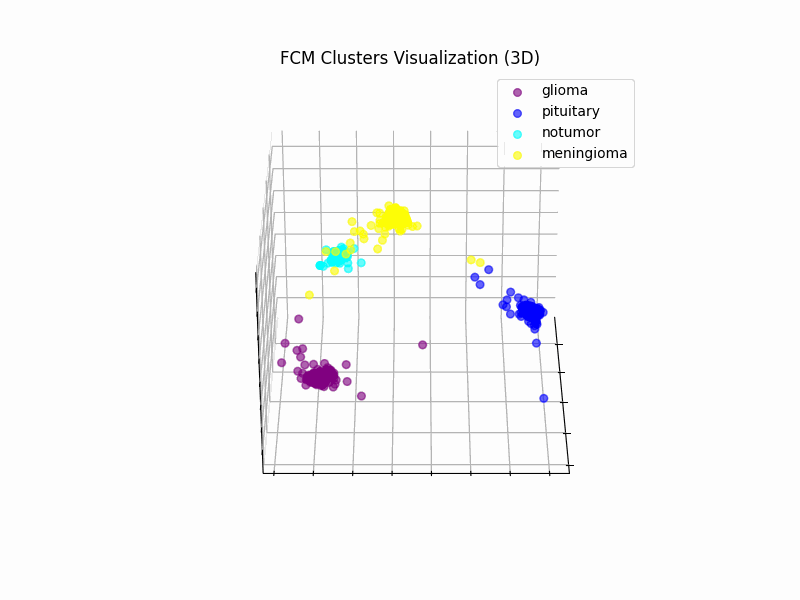

In [6]:
from IPython.display import Image
Image(filename='fcm_3d_clustering_deit.gif')